In [2]:
!pip install pytesseract pdf2image -q
!sudo apt-get install poppler-utils -y
!pip install python-bidi arabic-reshaper -q

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libpoppler-cpp0t64 libpoppler-glib8t64 libpoppler134
The following packages will be upgraded:
  libpoppler-cpp0t64 libpoppler-glib8t64 libpoppler134 poppler-utils
4 upgraded, 0 newly installed, 0 to remove and 228 not upgraded.
Need to get 0 B/1527 kB of archives.
After this operation, 0 B of additional disk space will be used.
(Reading database ... 126290 files and directories currently installed.)
Preparing to unpack .../poppler-utils_24.02.0-1ubuntu9.6_amd64.deb ...
Unpacking poppler-utils (24.02.0-1ubuntu9.6) over (24.02.0-1ubuntu9.5) ...
Preparing to unpack .../libpoppler-glib8t64_24.02.0-1ubuntu9.6_amd64.deb ...
Unpacking libpoppler-glib8t64:amd64 (24.02.0-1ubuntu9.6) over (24.02.0-1ubuntu9.5) ...
Preparing to unpack .../libpoppler-cpp0t64_24.02.0-1ubuntu9.6_amd64.deb ...
Unpacking libpoppler-cpp0t64:amd64 (24.02.0-1ubuntu9.6) ove

In [3]:
!pip install transformers qwen_vl_utils accelerate>=0.26.0 PEFT -U -q
!pip install -U bitsandbytes -q

In [ ]:
!pip install docling

  Using cached pillow-11.3.0-cp310-cp310-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (9.0 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached annotated_types-0.7.0-py3-none-any.whl.metadata (15 kB)
  Using cached opencv_python-4.12.0.88-cp37-abi3-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (19 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 14.1 MB/s  0:00:01m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 13.0 MB/s  0:00:00 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 12.4 MB/s  0:00:01m0:00:0100:01
Using cached pillow-11.3.0-cp310-cp310-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (6.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 11.1 MB/s  0:00:00
   ━━

In [ ]:
import arabic_reshaper
from bidi.algorithm import get_display

In [ ]:
import os
langs = ["eng", "ara", "fas"]
tessdata_path = "/usr/share/tesseract-ocr/4.00/tessdata/"
os.makedirs(tessdata_path, exist_ok=True)
for lang in langs:
    url = f"https://github.com/tesseract-ocr/tessdata/raw/main/{lang}.traineddata"
    output_file = os.path.join(tessdata_path, f"{lang}.traineddata")
    os.system(f"wget -O {output_file} {url}")

In [ ]:
!tesseract --list-langs

List of available languages (4):
ara
eng
fas
osd


In [ ]:
import os
import tempfile
import time
import torch
import cv2 as cv
import numpy as np
from PIL import Image
from pdf2image import convert_from_path
import pytesseract
import matplotlib.pyplot as plt
import imutils
import arabic_reshaper
from bidi.algorithm import get_display
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor, LlavaOnevisionForConditionalGeneration
from qwen_vl_utils import process_vision_info
from datetime import datetime

def log(msg):
    print(f"[{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}] {msg}")

class PDFOCRProcessor:
    def __init__(self, pdf_path, lang='eng+ara+fas', ocr_backend='tesseract',
                 qwen_model_name="NAMAA-Space/Qari-OCR-0.2.2.1-VL-2B-Instruct",
                 qwen_max_tokens=2000,
                 varco_model_name="NCSOFT/VARCO-VISION-2.0-1.7B-OCR",
                 varco_max_tokens=1024):
        self.pdf_path = pdf_path
        self.lang = lang
        self.ocr_backend = ocr_backend
        self.qwen_model_name = qwen_model_name
        self.qwen_max_tokens = qwen_max_tokens
        self.varco_model_name = varco_model_name
        self.varco_max_tokens = varco_max_tokens
        self.qwen_model = None
        self.qwen_processor = None
        self.varco_model = None
        self.varco_processor = None
        log("Initializing PDFOCRProcessor...")
        if self.ocr_backend == 'qwen':
            if not torch.cuda.is_available():
                raise RuntimeError("Qwen OCR requires a GPU, none detected.")
            log("Loading Qwen model and processor on GPU...")
            self.qwen_model = Qwen2VLForConditionalGeneration.from_pretrained(
                self.qwen_model_name, torch_dtype="auto", device_map="auto")
            self.qwen_processor = AutoProcessor.from_pretrained(self.qwen_model_name)
            log("Qwen model loaded on GPU.")
        if self.ocr_backend == 'varco':
            if not torch.cuda.is_available():
                raise RuntimeError("Varco OCR requires a GPU, none detected.")
            log("Loading Varco model and processor on GPU...")
            self.varco_model = LlavaOnevisionForConditionalGeneration.from_pretrained(
                self.varco_model_name, torch_dtype=torch.float16, attn_implementation="sdpa", device_map="auto")
            self.varco_processor = AutoProcessor.from_pretrained(self.varco_model_name)
            log("Varco model loaded on GPU.")

    def _to_gray(self, pil_image):
        img = np.array(pil_image)
        if len(img.shape) == 3 and img.shape[2] == 3:
            return cv.cvtColor(img, cv.COLOR_RGB2GRAY)
        return img

    def preprocess_page(self, pil_image):
        log("Preprocessing page...")
        img = cv.cvtColor(np.array(pil_image), cv.COLOR_RGB2BGR)
        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 35, 11)
        kernel = cv.getStructuringElement(cv.MORPH_RECT, (1,1))
        opening = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel)
        kernel = cv.getStructuringElement(cv.MORPH_RECT, (2,2))
        processed = cv.dilate(opening, kernel, iterations=1)
        log("Preprocessing done.")
        return Image.fromarray(processed)

    def enhance_contrast(self, pil_image):
        log("Enhancing contrast...")
        gray = self._to_gray(pil_image)
        clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        enhanced = clahe.apply(gray)
        log("Contrast enhancement done.")
        return Image.fromarray(enhanced)

    def rescale_image(self, pil_image, target_width=1200):
        log("Rescaling image...")
        img = cv.cvtColor(np.array(pil_image), cv.COLOR_RGB2BGR)
        img_resized = imutils.resize(img, width=target_width)
        img_resized = cv.cvtColor(img_resized, cv.COLOR_BGR2RGB)
        log("Rescaling done.")
        return Image.fromarray(img_resized)

    def _fit_image_to_memory(self, pil_image, max_pixels=2_000_000):
        w, h = pil_image.size
        orig_w, orig_h = w, h
        while w * h > max_pixels:
            w = max(1, w // 2)
            h = max(1, h // 2)
            log(f"Warning: image too large ({orig_w}x{orig_h}), scaling down to ({w}x{h})")
            pil_image = pil_image.resize((w, h), Image.LANCZOS)
        return pil_image

    def _ocr_tesseract(self, pil_image):
        log("Running Tesseract OCR...")
        result = pytesseract.image_to_string(pil_image, lang=self.lang)
        log("Tesseract OCR done.")
        return result

    def _ocr_qwen(self, pil_image):
        log("Running Qwen OCR...")
        torch.cuda.empty_cache()
        fd, src = tempfile.mkstemp(suffix=".png")
        os.close(fd)
        pil_image.save(src)
        prompt = "Below is the image of one page of a document, as well as some raw textual content that was previously extracted for it. Just return the plain text representation of this document as if you were reading it naturally. Do not hallucinate."
        messages = [{"role": "user", "content":[{"type":"image","image":f"file://{src}"},{"type":"text","text":prompt}]}]
        log("Applying chat template...")
        text_template = self.qwen_processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
        log("Processing vision info...")
        image_inputs, video_inputs = process_vision_info(messages)
        inputs = self.qwen_processor(text=[text_template], images=image_inputs, videos=video_inputs, padding=True, return_tensors="pt")
        inputs = inputs.to("cuda")
        attempt = 0
        max_attempts = 5
        while attempt < max_attempts:
            try:
                log(f"Generating output from Qwen model, attempt {attempt+1}...")
                generated_ids = self.qwen_model.generate(**inputs, max_new_tokens=self.qwen_max_tokens)
                generated_ids_trimmed = [out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)]
                output_text = self.qwen_processor.batch_decode(generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]
                break
            except RuntimeError as e:
                if "out of memory" in str(e).lower():
                    log(f"CUDA OOM detected for Qwen, clearing cache and reducing image size...")
                    torch.cuda.empty_cache()
                    w, h = pil_image.size
                    new_w, new_h = max(1, int(w * 0.8)), max(1, int(h * 0.8))
                    log(f"Reducing image size from ({w},{h}) to ({new_w},{new_h}) and retrying...")
                    pil_image = pil_image.resize((new_w, new_h), Image.LANCZOS)
                    pil_image.save(src)
                    messages[0]["content"][0]["image"] = f"file://{src}"
                    text_template = self.qwen_processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
                    image_inputs, video_inputs = process_vision_info(messages)
                    inputs = self.qwen_processor(text=[text_template], images=image_inputs, videos=video_inputs, padding=True, return_tensors="pt")
                    inputs = inputs.to("cuda")
                    attempt += 1
                else:
                    try: os.remove(src)
                    except: pass
                    raise e
        else:
            try: os.remove(src)
            except: pass
            raise RuntimeError("Qwen failed after multiple memory reduction attempts.")
        try: os.remove(src)
        except: pass
        torch.cuda.empty_cache()
        log("Qwen OCR done.")
        return output_text

    def _ocr_varco(self, pil_image):
        log("Running Varco OCR...")
        torch.cuda.empty_cache()
        w, h = pil_image.size
        target_size = 2304
        if max(w, h) < target_size:
            scaling_factor = target_size / max(w, h)
            new_w = int(w * scaling_factor)
            new_h = int(h * scaling_factor)
            log(f"Upscaling image from ({w},{h}) to ({new_w},{new_h}) for Varco")
            pil_image = pil_image.resize((new_w, new_h), Image.LANCZOS)
        conversation = [{"role":"user","content":[{"type":"image","image":pil_image},{"type":"text","text":"<ocr>"}]}]
        attempt = 0
        max_attempts = 5
        while attempt < max_attempts:
            try:
                log(f"Applying Varco chat template, attempt {attempt+1}...")
                inputs = self.varco_processor.apply_chat_template(conversation, add_generation_prompt=True, tokenize=True, return_dict=True, return_tensors="pt")
                inputs = inputs.to(self.varco_model.device, torch.float16)
                log(f"Generating output from Varco model, attempt {attempt+1}...")
                generate_ids = self.varco_model.generate(**inputs, max_new_tokens=self.varco_max_tokens)
                generate_ids_trimmed = [out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generate_ids)]
                output = self.varco_processor.decode(generate_ids_trimmed[0], skip_special_tokens=False)
                break
            except RuntimeError as e:
                if "out of memory" in str(e).lower():
                    log(f"CUDA OOM detected for Varco, clearing cache and reducing image size...")
                    torch.cuda.empty_cache()
                    w, h = pil_image.size
                    new_w, new_h = max(1, int(w * 0.8)), max(1, int(h * 0.8))
                    log(f"Reducing image size from ({w},{h}) to ({new_w},{new_h}) and retrying...")
                    pil_image = pil_image.resize((new_w, new_h), Image.LANCZOS)
                    conversation[0]["content"][0]["image"] = pil_image
                    attempt += 1
                else:
                    raise e
        else:
            raise RuntimeError("Varco failed after multiple memory reduction attempts.")
        torch.cuda.empty_cache()
        log("Varco OCR done.")
        return output

    def ocr_image(self, pil_image):
        if self.ocr_backend == 'qwen':
            return self._ocr_qwen(pil_image)
        if self.ocr_backend == 'varco':
            return self._ocr_varco(pil_image)
        return self._ocr_tesseract(pil_image)

    def visualize(self, image, text, title):
        plt.figure(figsize=(12,6))
        plt.subplot(1,2,1)
        plt.imshow(image, cmap="gray")
        plt.title(title)
        plt.axis("off")
        plt.subplot(1,2,2)
        reshaped = arabic_reshaper.reshape(text)
        bidi_text = get_display(reshaped)
        plt.text(0, 1, bidi_text, fontsize=10, va="top", wrap=True)
        plt.title("OCR Text")
        plt.axis("off")
        plt.show()

    def process_demo(self, start_page=1, end_page=None, preprocess=False, contrast=False, scale=False, show=True):
        log("Starting demo processing...")
        images = convert_from_path(self.pdf_path, first_page=start_page, last_page=end_page)
        text = {}
        for i, image in enumerate(images, start=start_page):
            log(f"Processing page {i}...")
            img = image
            if preprocess: img = self.preprocess_page(img)
            if contrast: img = self.enhance_contrast(img)
            if scale: img = self.rescale_image(img)
            page_text = self.ocr_image(img)
            text[i] = page_text
            if show: self.visualize(img, page_text, f"Page {i}")
            log(f"Page {i} OCR done.")
        log("Demo OCR completed.")
        return text

    def process(self, start_page=1, end_page=None, preprocess=False, contrast=False, scale=False):
        log("Starting batch processing...")
        images = convert_from_path(self.pdf_path, first_page=start_page, last_page=end_page)
        results = []
        for i, image in enumerate(images, start=start_page):
            log(f"Processing page {i}...")
            img = image
            if preprocess: img = self.preprocess_page(img)
            if contrast: img = self.enhance_contrast(img)
            if scale: img = self.rescale_image(img)
            start_t = time.time()
            page_text = self.ocr_image(img)
            duration = int(time.time() - start_t)
            log(f"Page {i} completed in {duration} seconds")
            results.append({i: (page_text, duration)})
        log("Batch processing completed.")
        return results


In [ ]:
from pathlib import Path

pdf_path = '/content/drive/MyDrive/قصه‌های مشدی .pdf'
assert Path(pdf_path).exists(), f"File not found: {pdf_path}"

In [ ]:
processor_tesseract = PDFOCRProcessor(pdf_path, lang='fas', ocr_backend='tesseract')


In [ ]:
processor_qwen = PDFOCRProcessor(pdf_path, lang='fas', ocr_backend='qwen')


In [ ]:
processor_varco = PDFOCRProcessor(pdf_path, lang='fas', ocr_backend='varco')


`torch_dtype` is deprecated! Use `dtype` instead!


[2025-10-24 12:27:15] Initializing PDFOCRProcessor...
[2025-10-24 12:27:15] Loading Varco model and processor on GPU...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/4.25G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/121 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/219 [00:00<?, ?B/s]

chat_template.jinja: 0.00B [00:00, ?B/s]

preprocessor_config.json: 0.00B [00:00, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/948 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/585 [00:00<?, ?B/s]

video_preprocessor_config.json:   0%|          | 0.00/753 [00:00<?, ?B/s]

[2025-10-24 12:29:15] Varco model loaded on GPU.


In [ ]:
# --- Tesseract OCR ---
print("\n===== TESSERACT OCR TESTS =====\n")

print("1️⃣ No preprocessing")
res1_tess = processor_tesseract.process(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False)

print("\n2️⃣ With preprocessing only")
res2_tess = processor_tesseract.process(start_page=1, end_page=8, preprocess=True, contrast=False, scale=False)

print("\n3️⃣ With preprocessing + contrast")
res3_tess = processor_tesseract.process(start_page=1, end_page=8, preprocess=True, contrast=True, scale=False)

print("\n4️⃣ With preprocessing + contrast + scaling")
res4_tess = processor_tesseract.process(start_page=1, end_page=8, preprocess=True, contrast=True, scale=True)


# --- Qwen OCR ---
print("\n\n===== QWEN OCR TESTS =====\n")

print("1️⃣ No preprocessing")
res1_qwen = processor_qwen.process(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False)

print("\n2️⃣ With preprocessing only")
res2_qwen = processor_qwen.process(start_page=1, end_page=8, preprocess=True, contrast=False, scale=False)

print("\n3️⃣ With preprocessing + contrast")
res3_qwen = processor_qwen.process(start_page=1, end_page=8, preprocess=True, contrast=True, scale=False)

print("\n4️⃣ With preprocessing + contrast + scaling")
res4_qwen = processor_qwen.process(start_page=1, end_page=8, preprocess=True, contrast=True, scale=True)


In [ ]:
# --- Tesseract OCR DEMO ---
print("\n===== TESSERACT OCR DEMO =====\n")

print("1️⃣ No preprocessing")
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False, show=True)

print("\n2️⃣ With preprocessing only")
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=True, contrast=False, scale=False, show=True)

print("\n3️⃣ With preprocessing + contrast")
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=False, show=True)

print("\n4️⃣ With preprocessing + contrast + scaling")
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=True, show=True)


# --- Qwen OCR DEMO ---
print("\n\n===== QWEN OCR DEMO =====\n")

print("1️⃣ No preprocessing")
processor_qwen.process_demo(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False, show=True)

print("\n2️⃣ With preprocessing only")
processor_qwen.process_demo(start_page=1, end_page=8, preprocess=True, contrast=False, scale=False, show=True)

print("\n3️⃣ With preprocessing + contrast")
processor_qwen.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=False, show=True)

print("\n4️⃣ With preprocessing + contrast + scaling")
processor_qwen.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=True, show=True)


# --- Varco OCR DEMO ---
print("\n\n===== VARCO OCR DEMO =====\n")

print("1️⃣ No preprocessing")
processor_varco.process_demo(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False, show=True)

print("\n2️⃣ With preprocessing only")
processor_varco.process_demo(start_page=1, end_page=8, preprocess=True, contrast=False, scale=False, show=True)

print("\n3️⃣ With preprocessing + contrast")
processor_varco.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=False, show=True)

print("\n4️⃣ With preprocessing + contrast + scaling")
processor_varco.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=True, show=True)


[2025-10-24 12:06:57] Starting demo processing...
[2025-10-24 12:07:05] Processing page 1...
[2025-10-24 12:07:05] Running Tesseract OCR...
[2025-10-24 12:07:10] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


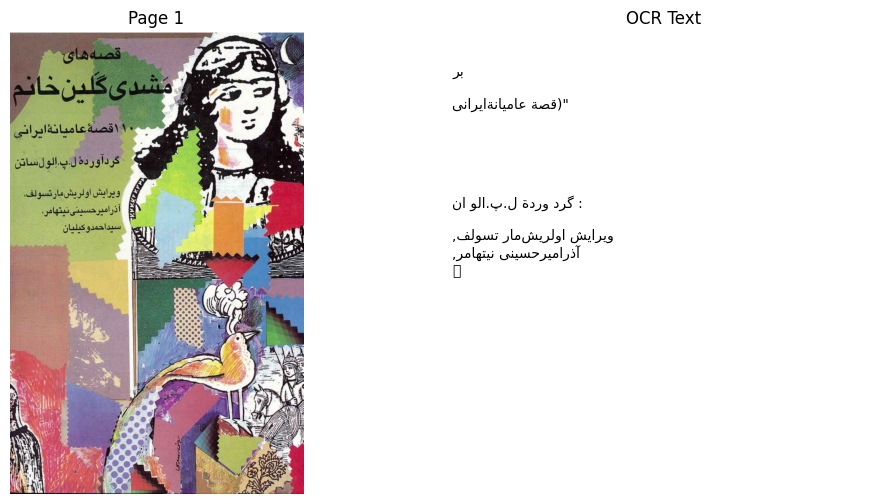

[2025-10-24 12:07:13] Page 1 OCR done.
[2025-10-24 12:07:13] Processing page 2...
[2025-10-24 12:07:13] Running Tesseract OCR...
[2025-10-24 12:07:17] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


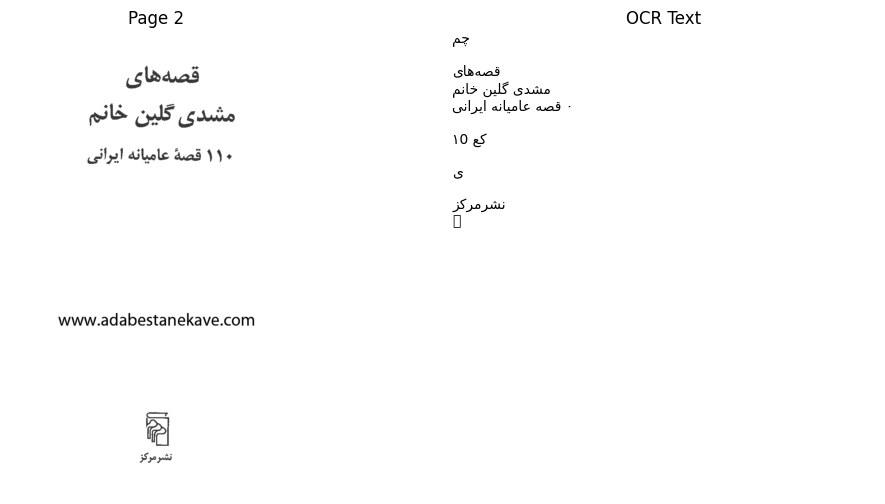

[2025-10-24 12:07:18] Page 2 OCR done.
[2025-10-24 12:07:18] Processing page 3...
[2025-10-24 12:07:18] Running Tesseract OCR...
[2025-10-24 12:07:26] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


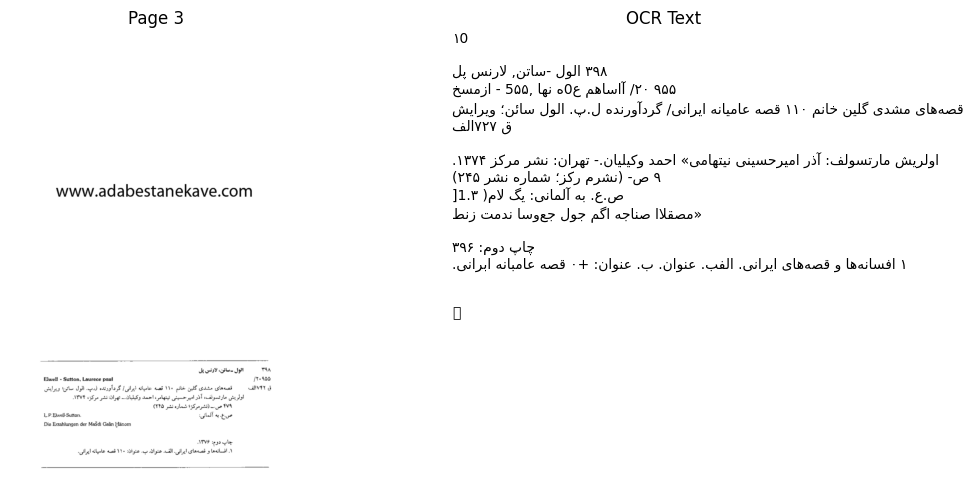

[2025-10-24 12:07:28] Page 3 OCR done.
[2025-10-24 12:07:28] Processing page 4...
[2025-10-24 12:07:28] Running Tesseract OCR...
[2025-10-24 12:07:32] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


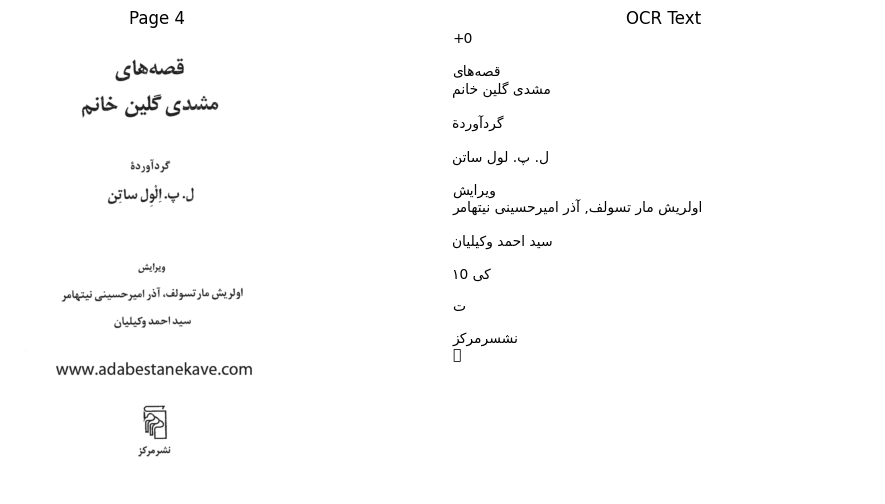

[2025-10-24 12:07:33] Page 4 OCR done.
[2025-10-24 12:07:33] Processing page 5...
[2025-10-24 12:07:33] Running Tesseract OCR...
[2025-10-24 12:07:43] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


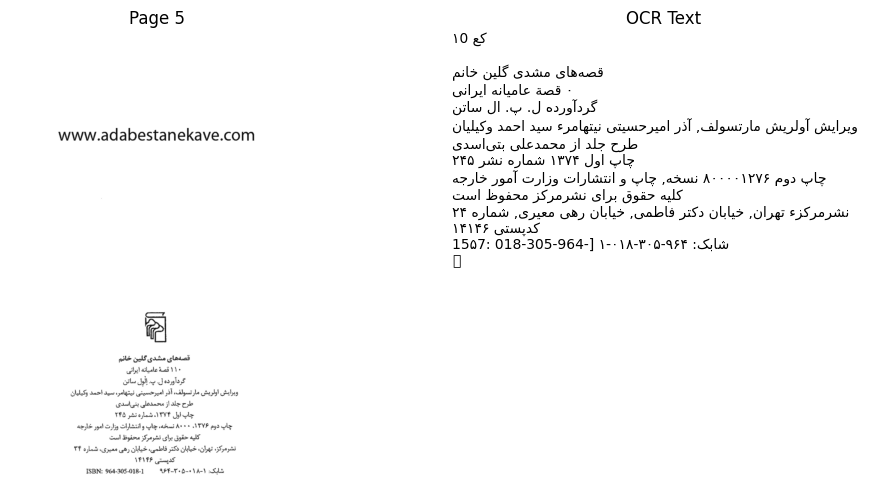

[2025-10-24 12:07:45] Page 5 OCR done.
[2025-10-24 12:07:45] Processing page 6...
[2025-10-24 12:07:45] Running Tesseract OCR...
[2025-10-24 12:08:03] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


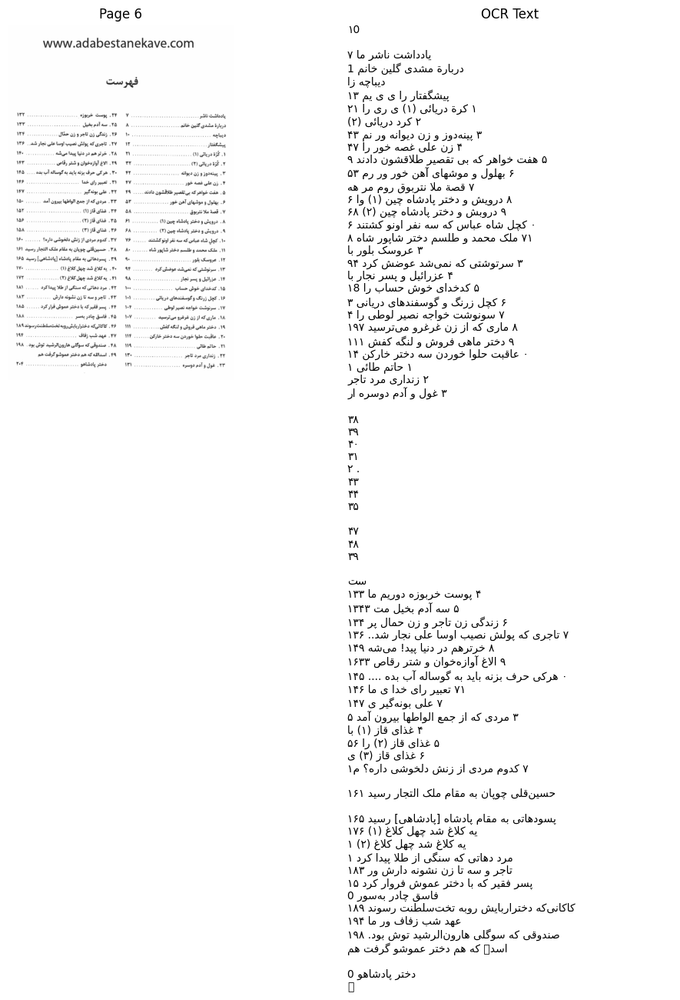

[2025-10-24 12:08:05] Page 6 OCR done.
[2025-10-24 12:08:05] Processing page 7...
[2025-10-24 12:08:05] Running Tesseract OCR...
[2025-10-24 12:08:26] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


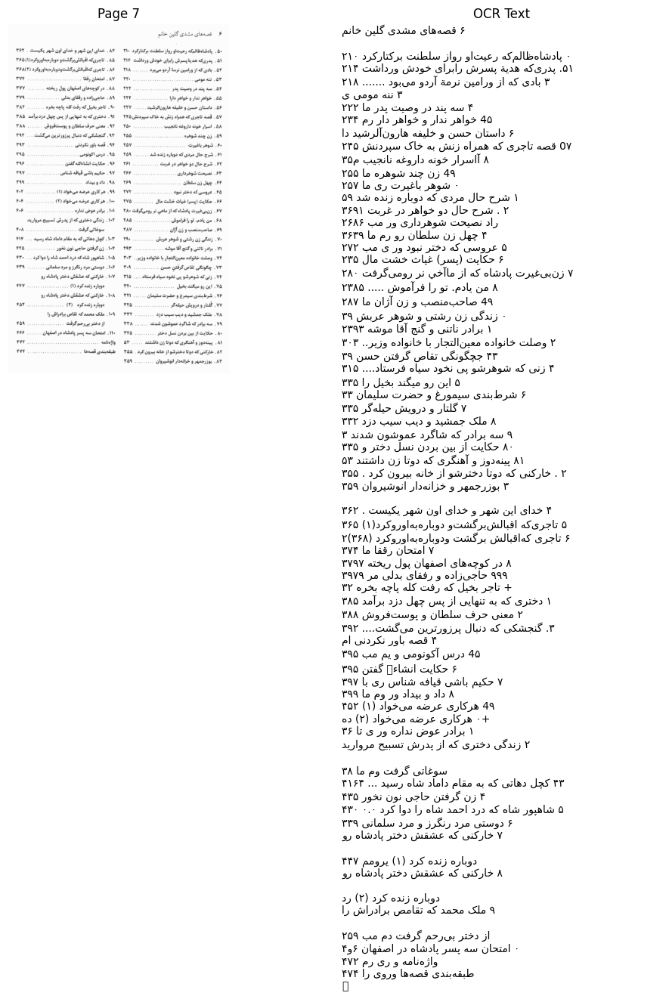

[2025-10-24 12:08:28] Page 7 OCR done.
[2025-10-24 12:08:28] Processing page 8...
[2025-10-24 12:08:28] Running Tesseract OCR...
[2025-10-24 12:08:37] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


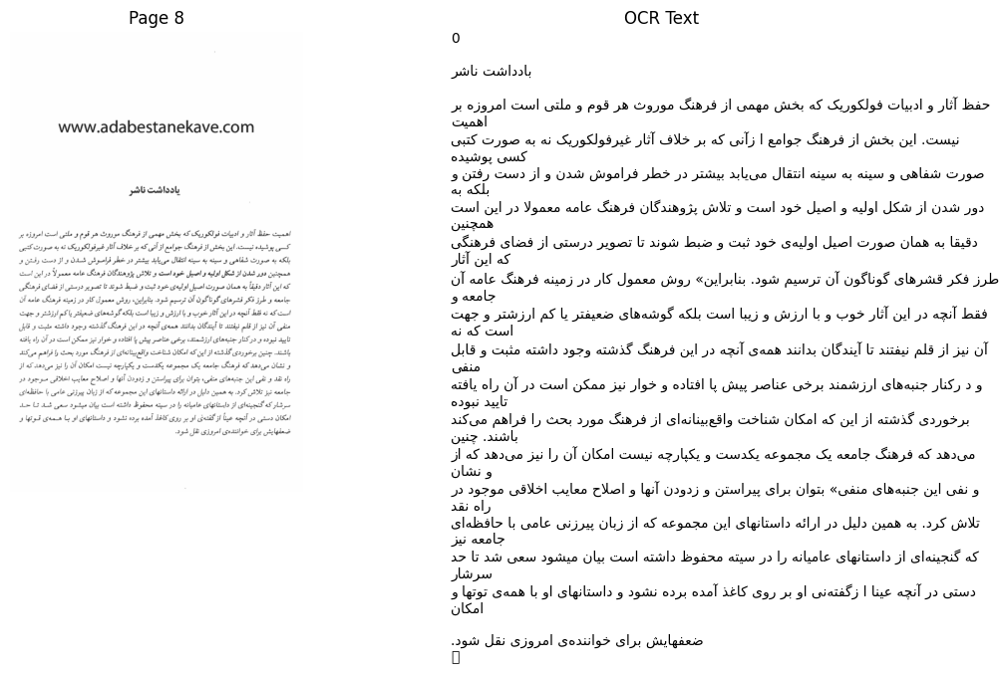

[2025-10-24 12:08:39] Page 8 OCR done.
[2025-10-24 12:08:39] Demo OCR completed.


{1: '  \n\nبر\n\n"(قصة عامیانةایرانی\n\n  \n  \n  \n\n: گرد وردةٌ ل.پ.الو ان\n\nویرایش اولریش\u200cمار تسولف,\nآذرامیرحسینی نیتهامر,\n\x0c',
 2: 'چم\n\nقصه\u200cهای\nمشدی گلین خانم\n۰ قصهٌ عامیانه ایرانی\n\nکع ۱0\n\nی\n\nنشرمرکز\n\x0c',
 3: '۱0\n\n۳۹۸ الول -ساتن, لارنس پل\n۹۵۵ ۲۰/ آاساهم ع0ه نها ,5۵۵ - ازمسخ\nق ۷۲۷الف قصه\u200cهای مشدی گلین خانم ۱۱۰ قصه عامیانه ایرانی/ گرد\u200cآورنده ل.پ. الول سائن؛ ویرایش\n\nاولریش مارتسولف: آذر امیرحسینی نیتهامی» احمد وکیلیان.- تهران: نشر مرکز ۱۳۷۴.\n۹ ص- (نشرم رکز؛ شماره نشر ۲۴۵)\nص.ع. به آلمانی: یگ لام( 1.۳[\n«مصقلاا صناجه اگم جول جع\u200cوسا ندمت زنط\n\nچاپ دوم: ۳۹۶\n۱ افسانه\u200cها و قصه\u200cهای ایرانی. الْفب. عنوان. ب. عنوان: +۰ قصه عامبانه ابرانی.\n\n \n\x0c',
 4: '0+\n\nقصه\u200cهای\nمشدی گلین خانم\n\nگردآوردة\n\nل. پ. لول ساتن\n\nویرایش\nاولریش مار تسولف, آذر امیرحسینی نیتهامر\n\nسید احمد وکیلیان\n\nکی ۱0\n\nت\n\nنشسرمرکز\n\x0c',
 5: 'کع ۱0\n\nقصه\u200cهای مشدی گلین خانم\n۰ قصة عامیانه ایرانی\nگردآورده ل. پ. ال ساتن\nویرایش آولریش مارتسولف

In [ ]:
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False, show=True)

[2025-10-24 12:08:39] Starting demo processing...
[2025-10-24 12:08:41] Processing page 1...
[2025-10-24 12:08:41] Preprocessing page...
[2025-10-24 12:08:41] Preprocessing done.
[2025-10-24 12:08:41] Running Tesseract OCR...
[2025-10-24 12:08:42] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


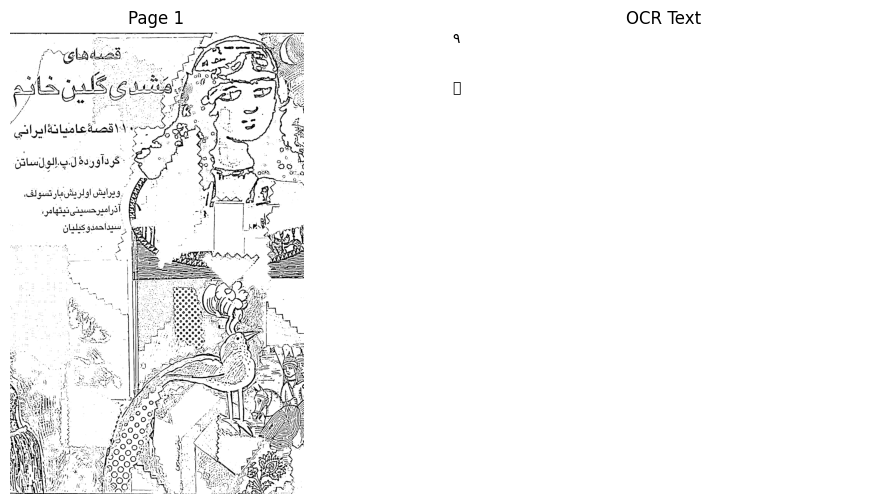

[2025-10-24 12:08:43] Page 1 OCR done.
[2025-10-24 12:08:43] Processing page 2...
[2025-10-24 12:08:43] Preprocessing page...
[2025-10-24 12:08:43] Preprocessing done.
[2025-10-24 12:08:43] Running Tesseract OCR...
[2025-10-24 12:08:44] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


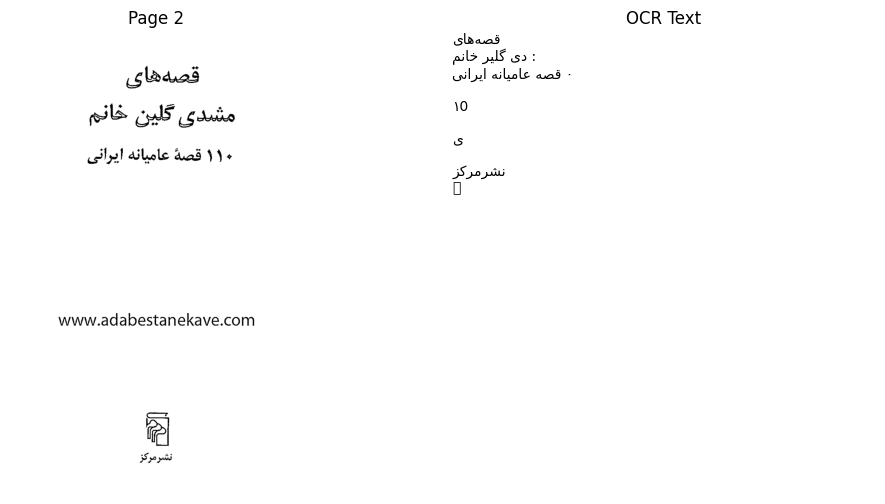

[2025-10-24 12:08:45] Page 2 OCR done.
[2025-10-24 12:08:45] Processing page 3...
[2025-10-24 12:08:45] Preprocessing page...
[2025-10-24 12:08:45] Preprocessing done.
[2025-10-24 12:08:45] Running Tesseract OCR...
[2025-10-24 12:08:50] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


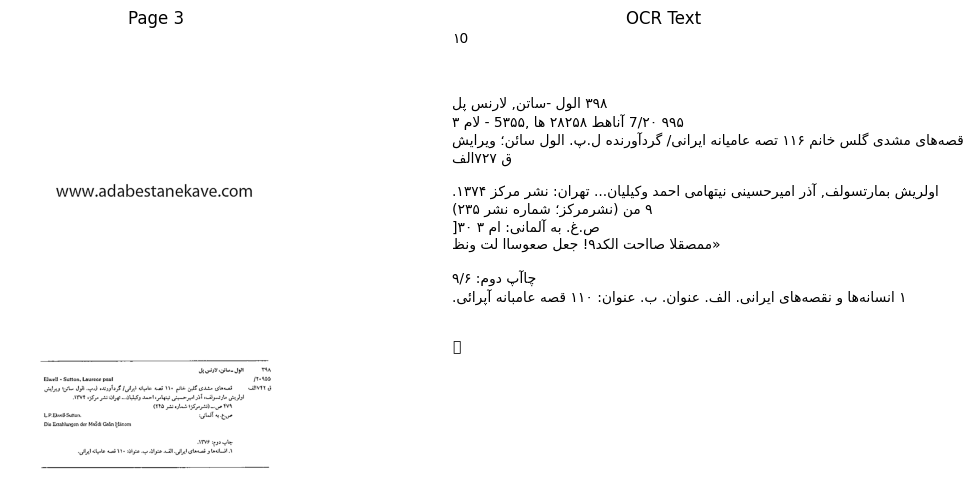

[2025-10-24 12:08:51] Page 3 OCR done.
[2025-10-24 12:08:51] Processing page 4...
[2025-10-24 12:08:51] Preprocessing page...
[2025-10-24 12:08:51] Preprocessing done.
[2025-10-24 12:08:51] Running Tesseract OCR...
[2025-10-24 12:08:53] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


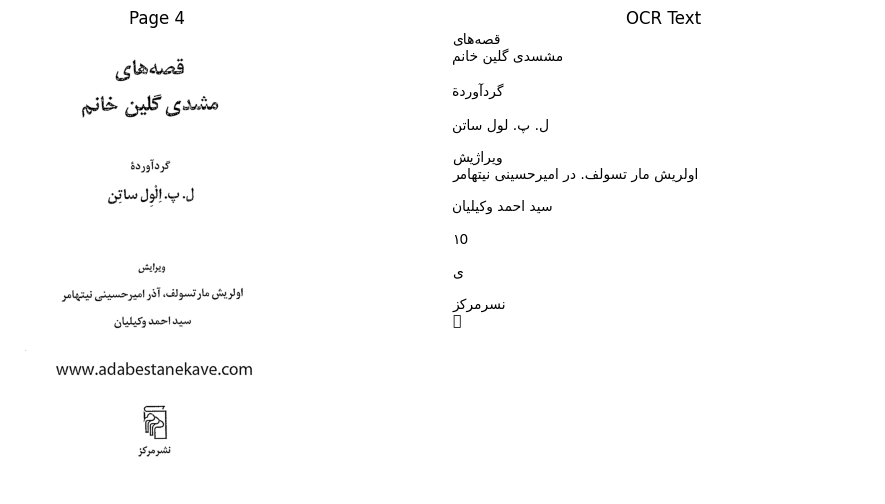

[2025-10-24 12:08:54] Page 4 OCR done.
[2025-10-24 12:08:54] Processing page 5...
[2025-10-24 12:08:54] Preprocessing page...
[2025-10-24 12:08:54] Preprocessing done.
[2025-10-24 12:08:54] Running Tesseract OCR...
[2025-10-24 12:08:58] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


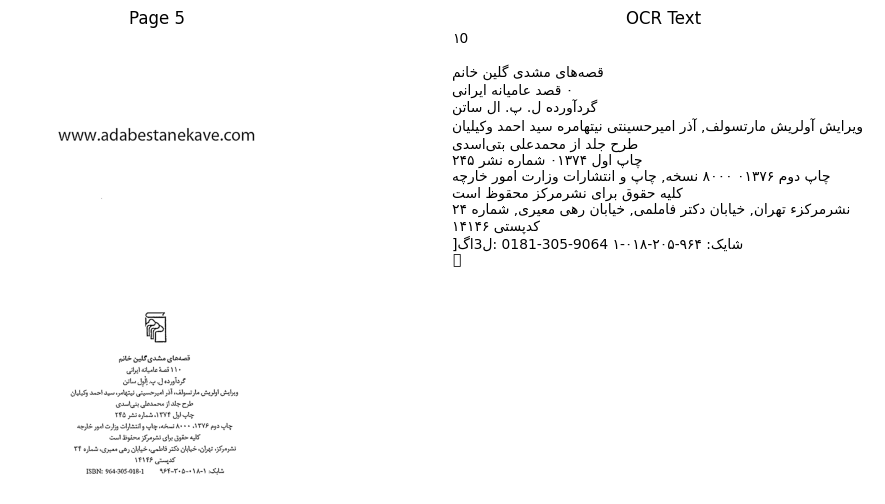

[2025-10-24 12:09:06] Page 5 OCR done.
[2025-10-24 12:09:06] Processing page 6...
[2025-10-24 12:09:06] Preprocessing page...
[2025-10-24 12:09:06] Preprocessing done.
[2025-10-24 12:09:06] Running Tesseract OCR...
[2025-10-24 12:09:23] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


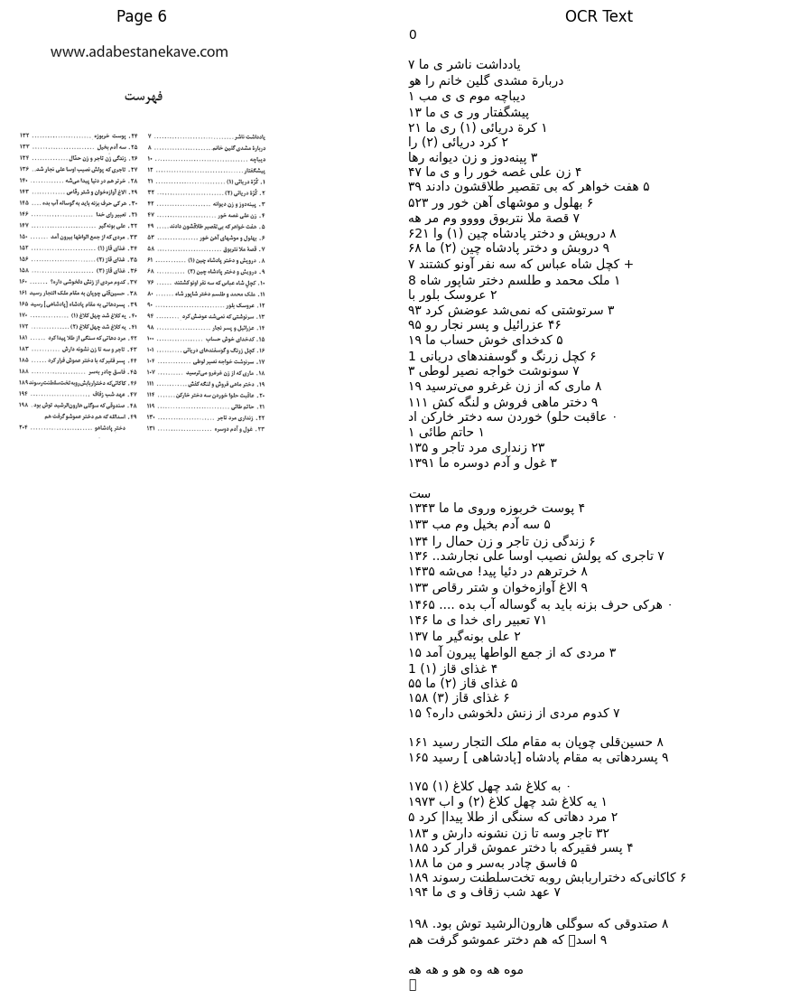

[2025-10-24 12:09:26] Page 6 OCR done.
[2025-10-24 12:09:26] Processing page 7...
[2025-10-24 12:09:26] Preprocessing page...
[2025-10-24 12:09:26] Preprocessing done.
[2025-10-24 12:09:26] Running Tesseract OCR...
[2025-10-24 12:09:46] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


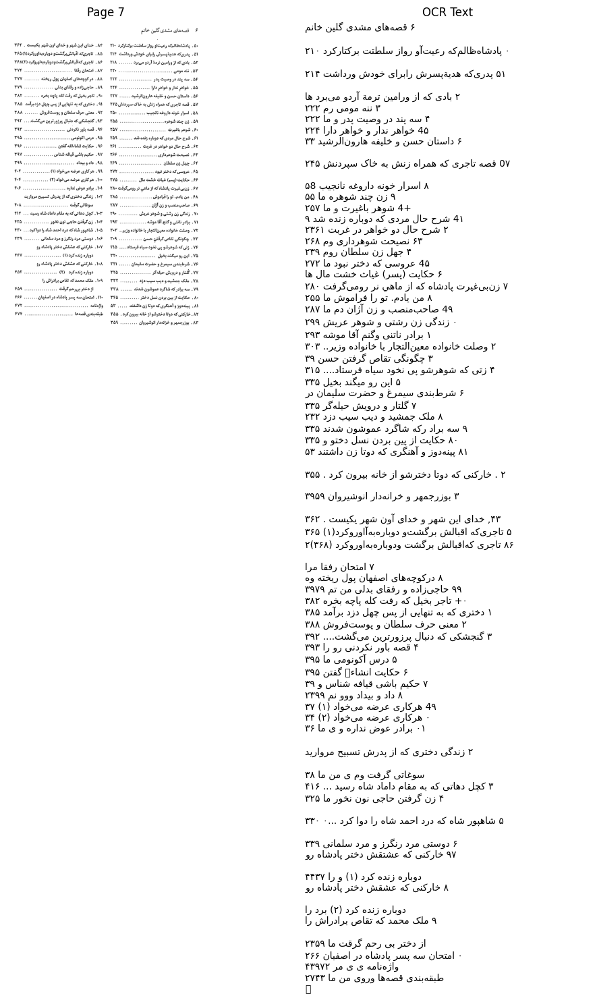

[2025-10-24 12:09:49] Page 7 OCR done.
[2025-10-24 12:09:49] Processing page 8...
[2025-10-24 12:09:49] Preprocessing page...
[2025-10-24 12:09:49] Preprocessing done.
[2025-10-24 12:09:49] Running Tesseract OCR...
[2025-10-24 12:09:58] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


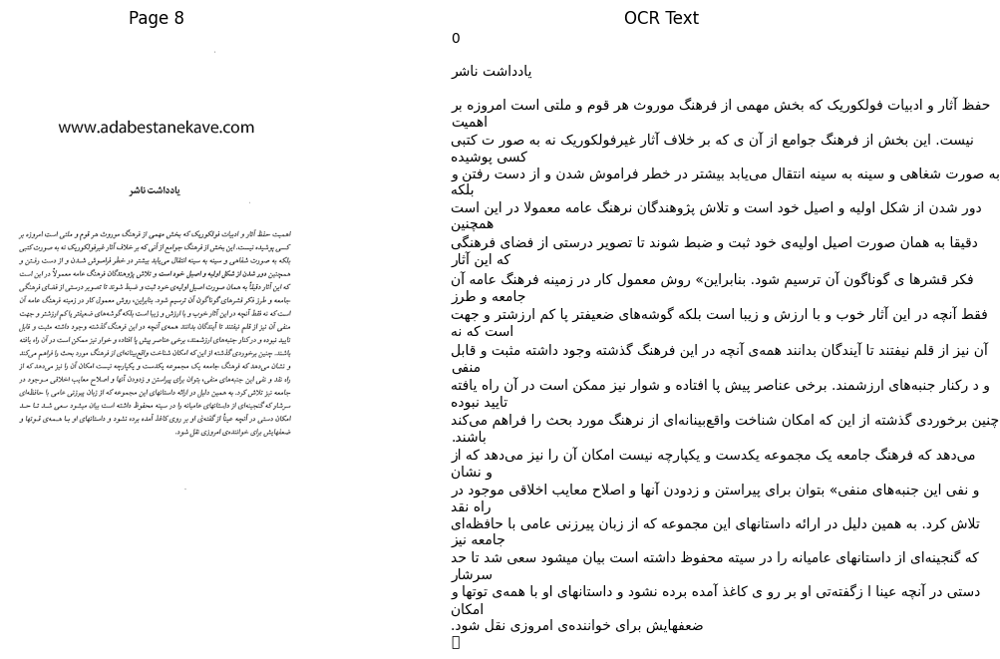

[2025-10-24 12:10:01] Page 8 OCR done.
[2025-10-24 12:10:01] Demo OCR completed.


{1: '۹\n\n \n\x0c',
 2: 'قصه\u200cهای\n: دی گلیر خانم\n۰ قصه عامیانه ایرانی\n\n۱0\n\nی\n\nنشرمرکز\n\x0c',
 3: '۱0\n\n \n\n۳۹۸ الول -ساتن, لارنس پل\n۹۹۵ 7/۲۰ آناهط ۲۸۲۵۸ ها ,5۳۵۵ - لام ۳\nق ۷۲۷الف قصه\u200cهای مشدی گلس خانم ۱۱۶ تصه عامیانه ایرانی/ گردآورنده ل.پ. الول سائن؛ ویرایش\n\nاولریش بمارتسولف, آذر امیرحسینی نیتهامی احمد وکیلیان... تهران: نشر مرکز ۱۳۷۴.\n۹ من (نشرمرکز؛ شماره نشر ۲۳۵)\nص.غ. به آلمانی: ام ۳ ۳۰[\n«ممصقلا صااحت الکد۹! جعل صعوساا لت ونظ\n\nچاآپ دوم: ۹/۶\n۱ انسانه\u200cها و نقصه\u200cهای ایرانی. الف. عنوان. ب. عنوان: ۱۱۰ قصه عامبانه آپرائی.\n\n \n\x0c',
 4: 'قصه\u200cهای\nمشسدی گلین خانم\n\nگردآوردةٌ\n\nل. پ. لول ساتن\n\nویراژیش\nاولریش مار تسولف. در امیرحسینی نیتهامر\n\nسید احمد وکیلیان\n\n۱0\n\nی\n\nنسرمرکز\n\x0c',
 5: '۱0\n\nقصه\u200cهای مشدی گلین خانم\n۰ قصدٌّ عامیانه ایرانی\nگردآورده ل. پ. ال ساتن\nویرایش آولریش مارتسولف, آذر امیرحسینتی نیتهامره سید احمد وکیلیان\nطرح جلد از محمدعلی بتی\u200cاسدی\nچاپ اول ۰۱۳۷۴ شماره نشر ۲۴۵\nچاپ دوم ۰۱۳۷۶ ۸۰۰۰ نسخه, چاپ و انتشارات 

In [ ]:
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=True, contrast=False, scale=False, show=True)

[2025-10-24 12:10:01] Starting demo processing...
[2025-10-24 12:10:02] Processing page 1...
[2025-10-24 12:10:02] Preprocessing page...
[2025-10-24 12:10:02] Preprocessing done.
[2025-10-24 12:10:02] Enhancing contrast...
[2025-10-24 12:10:03] Contrast enhancement done.
[2025-10-24 12:10:03] Running Tesseract OCR...
[2025-10-24 12:10:04] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


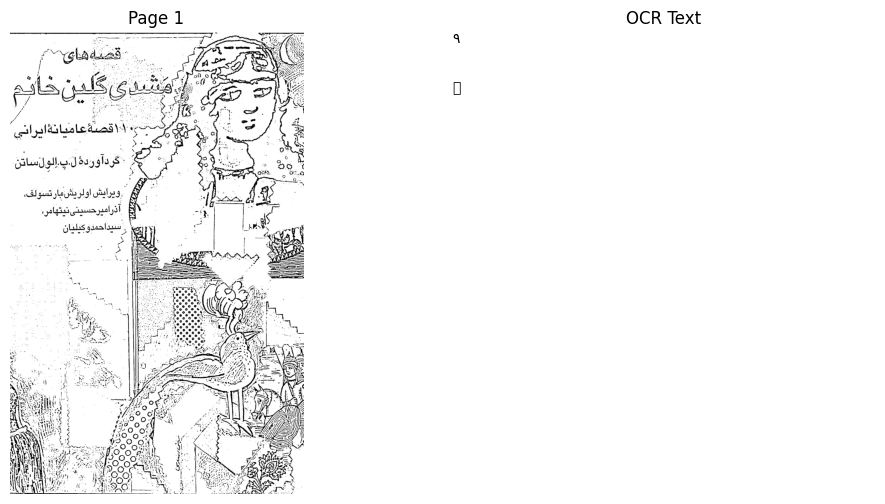

[2025-10-24 12:10:05] Page 1 OCR done.
[2025-10-24 12:10:05] Processing page 2...
[2025-10-24 12:10:05] Preprocessing page...
[2025-10-24 12:10:05] Preprocessing done.
[2025-10-24 12:10:05] Enhancing contrast...
[2025-10-24 12:10:05] Contrast enhancement done.
[2025-10-24 12:10:05] Running Tesseract OCR...
[2025-10-24 12:10:06] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


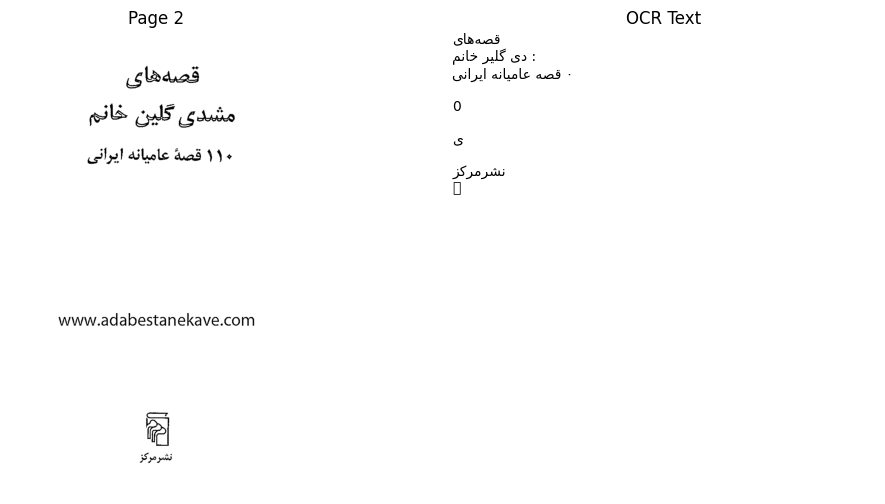

[2025-10-24 12:10:07] Page 2 OCR done.
[2025-10-24 12:10:07] Processing page 3...
[2025-10-24 12:10:07] Preprocessing page...
[2025-10-24 12:10:07] Preprocessing done.
[2025-10-24 12:10:07] Enhancing contrast...
[2025-10-24 12:10:07] Contrast enhancement done.
[2025-10-24 12:10:07] Running Tesseract OCR...
[2025-10-24 12:10:11] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


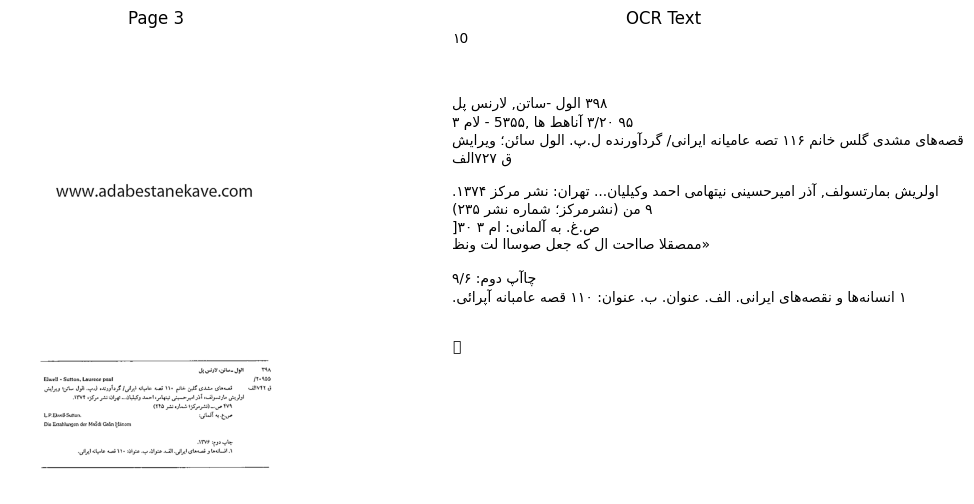

[2025-10-24 12:10:13] Page 3 OCR done.
[2025-10-24 12:10:13] Processing page 4...
[2025-10-24 12:10:13] Preprocessing page...
[2025-10-24 12:10:13] Preprocessing done.
[2025-10-24 12:10:13] Enhancing contrast...
[2025-10-24 12:10:13] Contrast enhancement done.
[2025-10-24 12:10:13] Running Tesseract OCR...
[2025-10-24 12:10:14] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


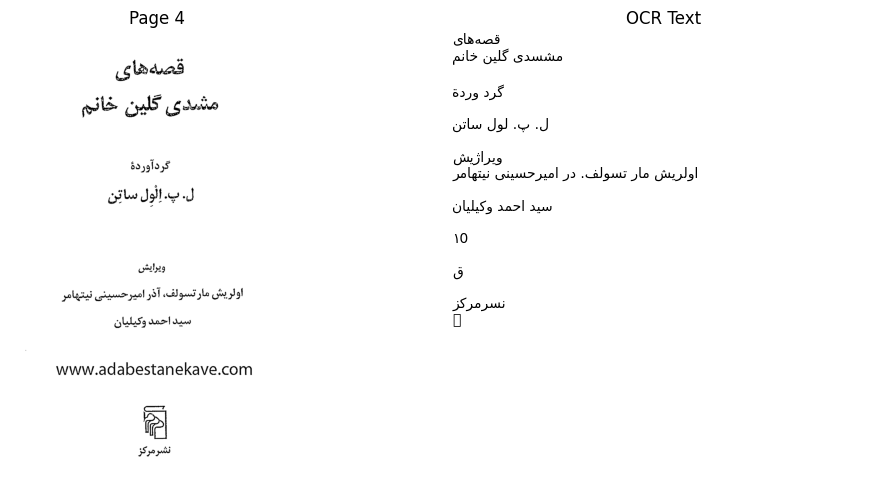

[2025-10-24 12:10:15] Page 4 OCR done.
[2025-10-24 12:10:15] Processing page 5...
[2025-10-24 12:10:15] Preprocessing page...
[2025-10-24 12:10:15] Preprocessing done.
[2025-10-24 12:10:15] Enhancing contrast...
[2025-10-24 12:10:15] Contrast enhancement done.
[2025-10-24 12:10:15] Running Tesseract OCR...
[2025-10-24 12:10:18] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


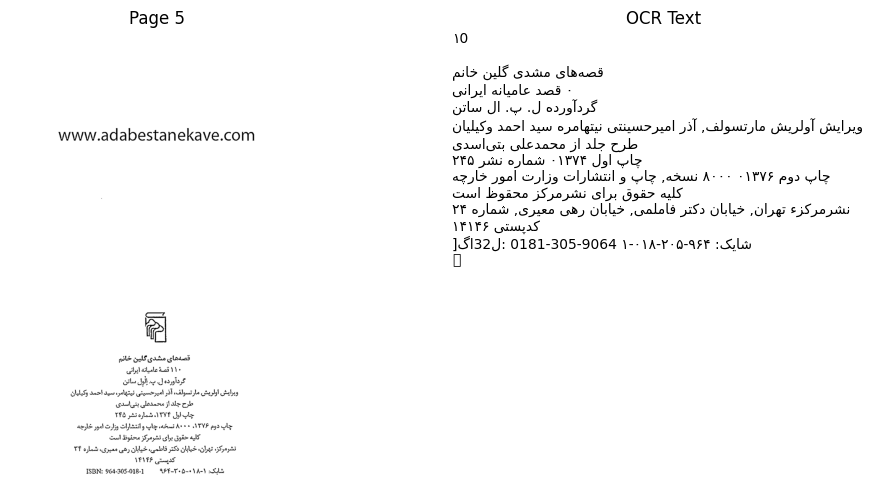

[2025-10-24 12:10:19] Page 5 OCR done.
[2025-10-24 12:10:19] Processing page 6...
[2025-10-24 12:10:19] Preprocessing page...
[2025-10-24 12:10:19] Preprocessing done.
[2025-10-24 12:10:19] Enhancing contrast...
[2025-10-24 12:10:19] Contrast enhancement done.
[2025-10-24 12:10:19] Running Tesseract OCR...
[2025-10-24 12:10:37] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


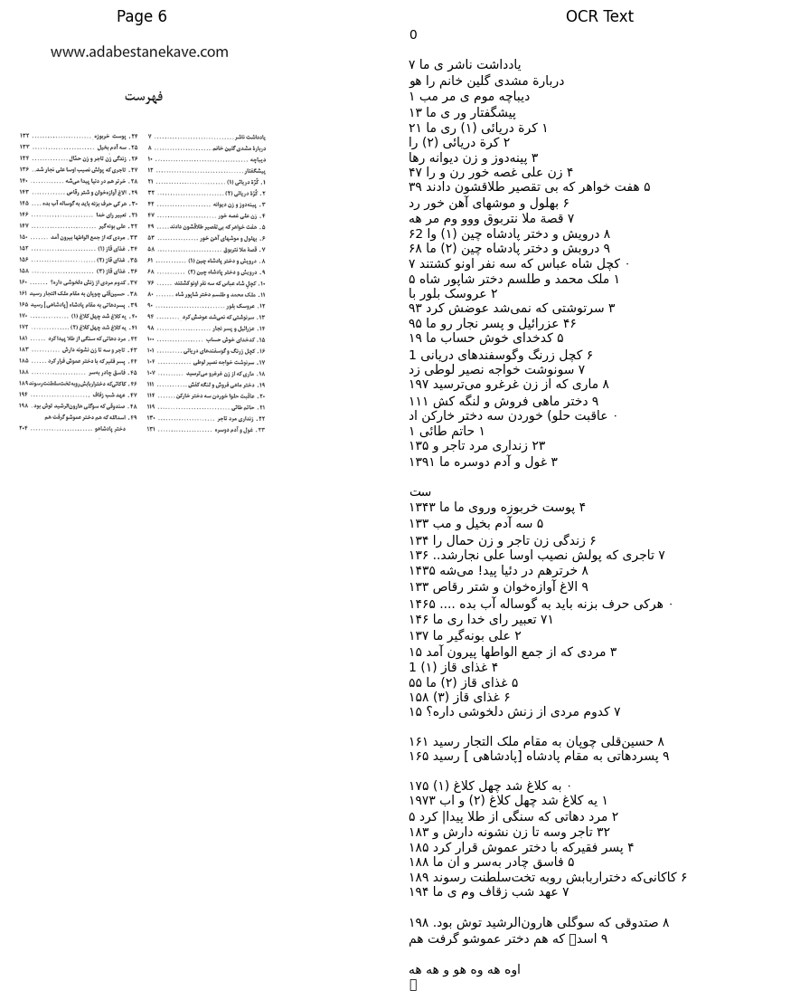

[2025-10-24 12:10:39] Page 6 OCR done.
[2025-10-24 12:10:39] Processing page 7...
[2025-10-24 12:10:39] Preprocessing page...
[2025-10-24 12:10:39] Preprocessing done.
[2025-10-24 12:10:39] Enhancing contrast...
[2025-10-24 12:10:39] Contrast enhancement done.
[2025-10-24 12:10:39] Running Tesseract OCR...
[2025-10-24 12:10:58] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


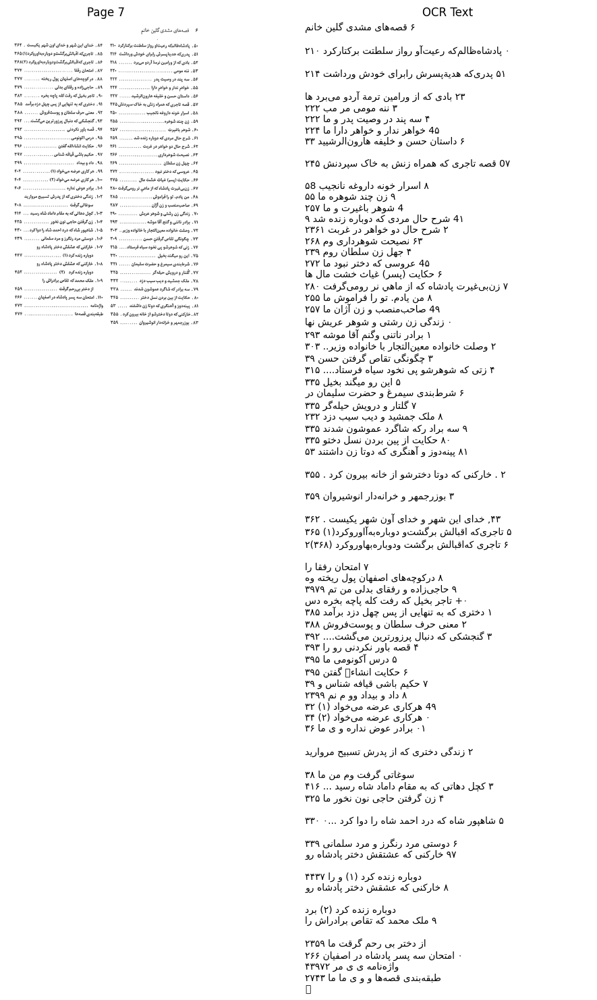

[2025-10-24 12:11:01] Page 7 OCR done.
[2025-10-24 12:11:01] Processing page 8...
[2025-10-24 12:11:01] Preprocessing page...
[2025-10-24 12:11:01] Preprocessing done.
[2025-10-24 12:11:01] Enhancing contrast...
[2025-10-24 12:11:01] Contrast enhancement done.
[2025-10-24 12:11:01] Running Tesseract OCR...
[2025-10-24 12:11:09] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


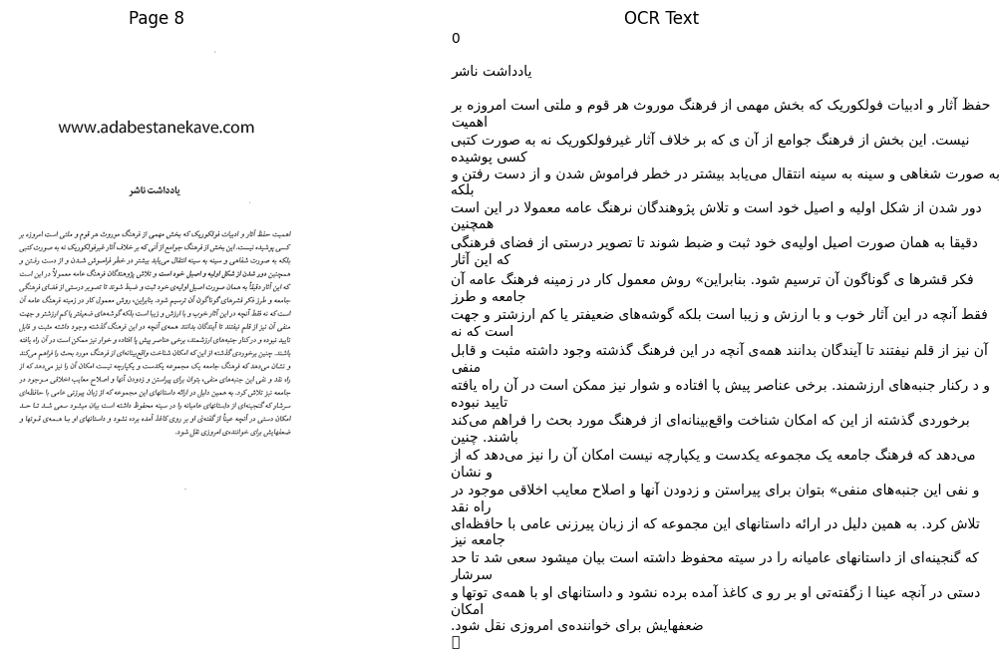

[2025-10-24 12:11:12] Page 8 OCR done.
[2025-10-24 12:11:12] Demo OCR completed.


{1: '۹\n\n \n\x0c',
 2: 'قصه\u200cهای\n: دی گلیر خانم\n۰ قصه عامیانه ایرانی\n\n0\n\nی\n\nنشرمرکز\n\x0c',
 3: '۱0\n\n \n\n۳۹۸ الول -ساتن, لارنس پل\n۹۵ ۳/۲۰ آناهط ها ,5۳۵۵ - لام ۳\nق ۷۲۷الف قصه\u200cهای مشدی گلس خانم ۱۱۶ تصه عامیانه ایرانی/ گردآورنده ل.پ. الول سائن؛ ویرایش\n\nاولریش بمارتسولف, آذر امیرحسینی نیتهامی احمد وکیلیان... تهران: نشر مرکز ۱۳۷۴.\n۹ من (نشرمرکز؛ شماره نشر ۲۳۵)\nص.غ. به آلمانی: ام ۳ ۳۰[\n«ممصقلا صااحت ال که جعل صوساا لت ونظ\n\nچاآپ دوم: ۹/۶\n۱ انسانه\u200cها و نقصه\u200cهای ایرانی. الف. عنوان. ب. عنوان: ۱۱۰ قصه عامبانه آپرائی.\n\n \n\x0c',
 4: 'قصه\u200cهای\nمشسدی گلین خانم\n\nگرد وردةٌ\n\nل. پ. لول ساتن\n\nویراژیش\nاولریش مار تسولف. در امیرحسینی نیتهامر\n\nسید احمد وکیلیان\n\n۱0\n\nق\n\nنسرمرکز\n\x0c',
 5: '۱0\n\nقصه\u200cهای مشدی گلین خانم\n۰ قصدٌّ عامیانه ایرانی\nگردآورده ل. پ. ال ساتن\nویرایش آولریش مارتسولف, آذر امیرحسینتی نیتهامره سید احمد وکیلیان\nطرح جلد از محمدعلی بتی\u200cاسدی\nچاپ اول ۰۱۳۷۴ شماره نشر ۲۴۵\nچاپ دوم ۰۱۳۷۶ ۸۰۰۰ نسخه, چاپ و انتشارات وزارت امور

In [ ]:
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=False, show=True)

[2025-10-24 12:11:12] Starting demo processing...
[2025-10-24 12:11:13] Processing page 1...
[2025-10-24 12:11:13] Preprocessing page...
[2025-10-24 12:11:13] Preprocessing done.
[2025-10-24 12:11:13] Enhancing contrast...
[2025-10-24 12:11:14] Contrast enhancement done.
[2025-10-24 12:11:14] Rescaling image...
[2025-10-24 12:11:14] Rescaling done.
[2025-10-24 12:11:14] Running Tesseract OCR...
[2025-10-24 12:11:16] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


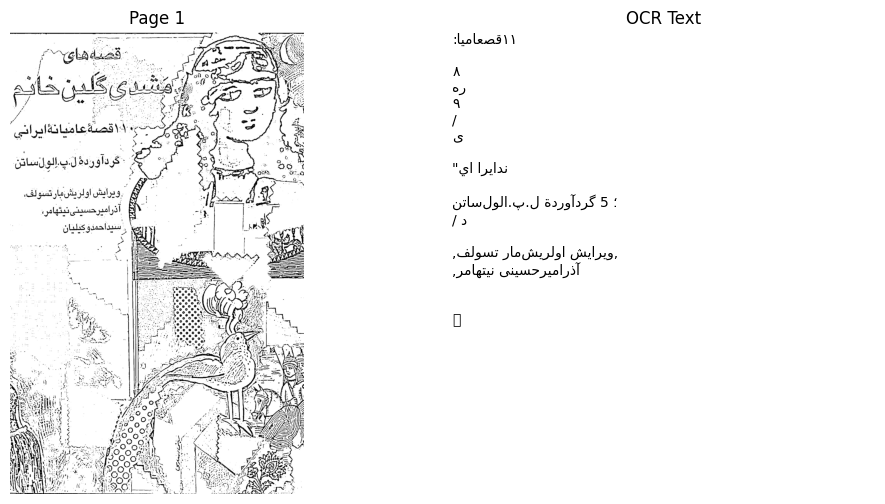

[2025-10-24 12:11:16] Page 1 OCR done.
[2025-10-24 12:11:16] Processing page 2...
[2025-10-24 12:11:16] Preprocessing page...
[2025-10-24 12:11:16] Preprocessing done.
[2025-10-24 12:11:16] Enhancing contrast...
[2025-10-24 12:11:16] Contrast enhancement done.
[2025-10-24 12:11:16] Rescaling image...
[2025-10-24 12:11:16] Rescaling done.
[2025-10-24 12:11:16] Running Tesseract OCR...
[2025-10-24 12:11:17] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


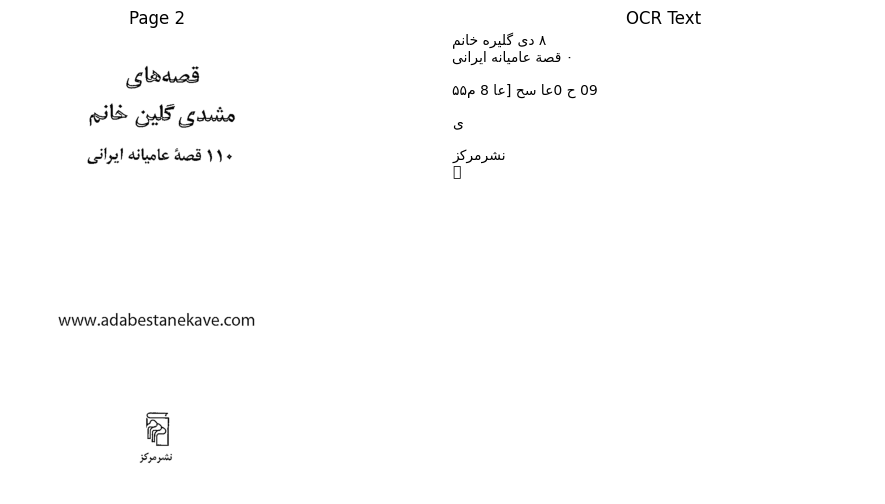

[2025-10-24 12:11:17] Page 2 OCR done.
[2025-10-24 12:11:17] Processing page 3...
[2025-10-24 12:11:17] Preprocessing page...
[2025-10-24 12:11:18] Preprocessing done.
[2025-10-24 12:11:18] Enhancing contrast...
[2025-10-24 12:11:18] Contrast enhancement done.
[2025-10-24 12:11:18] Rescaling image...
[2025-10-24 12:11:18] Rescaling done.
[2025-10-24 12:11:18] Running Tesseract OCR...
[2025-10-24 12:11:20] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


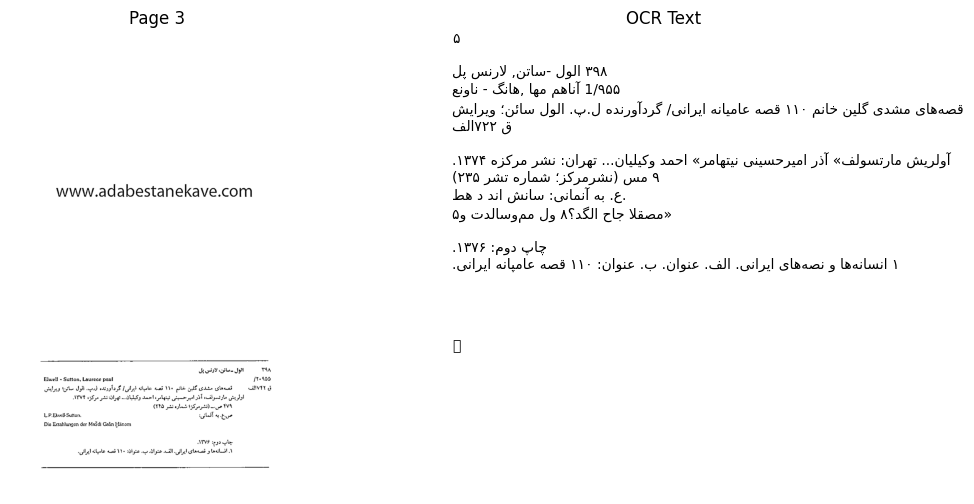

[2025-10-24 12:11:21] Page 3 OCR done.
[2025-10-24 12:11:21] Processing page 4...
[2025-10-24 12:11:21] Preprocessing page...
[2025-10-24 12:11:21] Preprocessing done.
[2025-10-24 12:11:21] Enhancing contrast...
[2025-10-24 12:11:21] Contrast enhancement done.
[2025-10-24 12:11:21] Rescaling image...
[2025-10-24 12:11:21] Rescaling done.
[2025-10-24 12:11:21] Running Tesseract OCR...
[2025-10-24 12:11:22] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


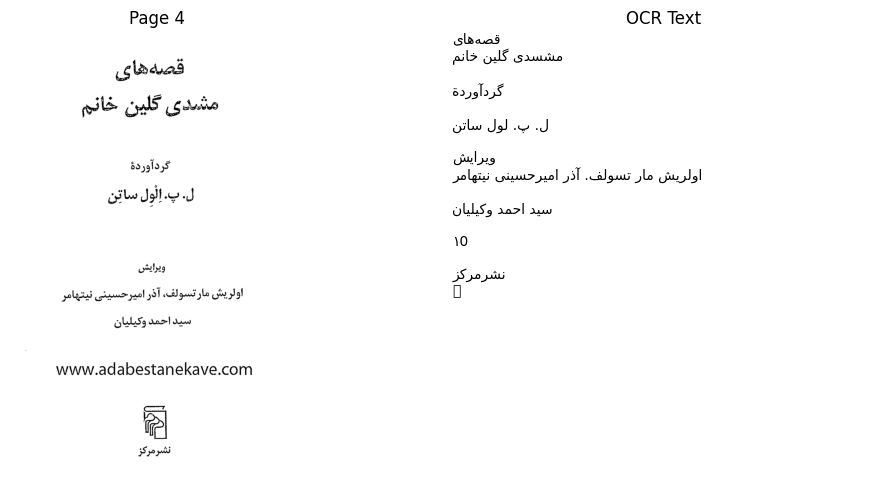

[2025-10-24 12:11:22] Page 4 OCR done.
[2025-10-24 12:11:22] Processing page 5...
[2025-10-24 12:11:22] Preprocessing page...
[2025-10-24 12:11:22] Preprocessing done.
[2025-10-24 12:11:22] Enhancing contrast...
[2025-10-24 12:11:22] Contrast enhancement done.
[2025-10-24 12:11:22] Rescaling image...
[2025-10-24 12:11:22] Rescaling done.
[2025-10-24 12:11:22] Running Tesseract OCR...
[2025-10-24 12:11:24] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


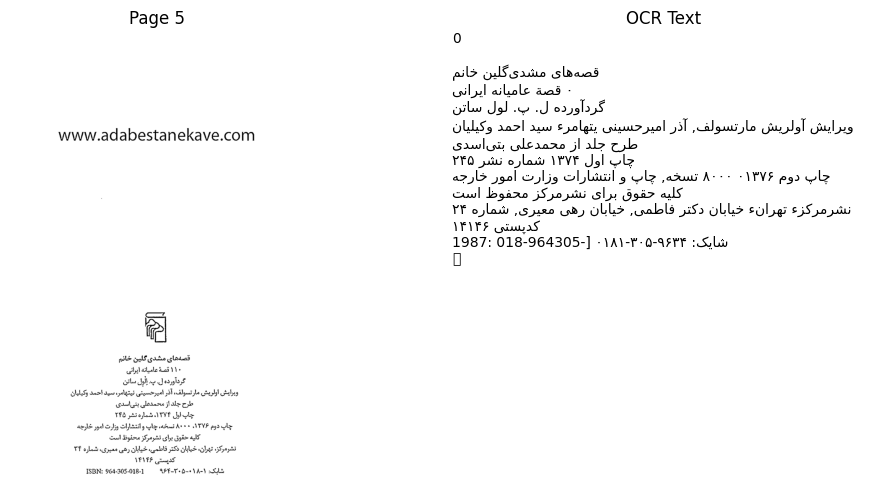

[2025-10-24 12:11:25] Page 5 OCR done.
[2025-10-24 12:11:25] Processing page 6...
[2025-10-24 12:11:25] Preprocessing page...
[2025-10-24 12:11:25] Preprocessing done.
[2025-10-24 12:11:25] Enhancing contrast...
[2025-10-24 12:11:25] Contrast enhancement done.
[2025-10-24 12:11:25] Rescaling image...
[2025-10-24 12:11:25] Rescaling done.
[2025-10-24 12:11:25] Running Tesseract OCR...
[2025-10-24 12:11:33] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


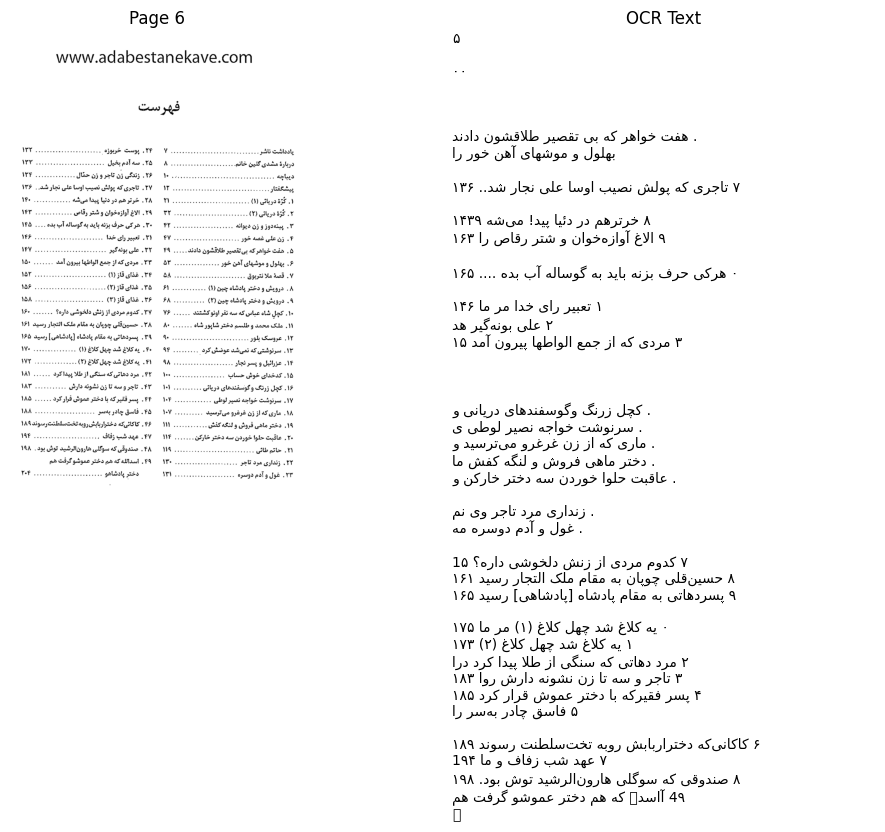

[2025-10-24 12:11:34] Page 6 OCR done.
[2025-10-24 12:11:34] Processing page 7...
[2025-10-24 12:11:34] Preprocessing page...
[2025-10-24 12:11:34] Preprocessing done.
[2025-10-24 12:11:34] Enhancing contrast...
[2025-10-24 12:11:34] Contrast enhancement done.
[2025-10-24 12:11:34] Rescaling image...
[2025-10-24 12:11:35] Rescaling done.
[2025-10-24 12:11:35] Running Tesseract OCR...
[2025-10-24 12:11:54] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65010 (\N{ARABIC LIGATURE ALLAH ISOLATED FORM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


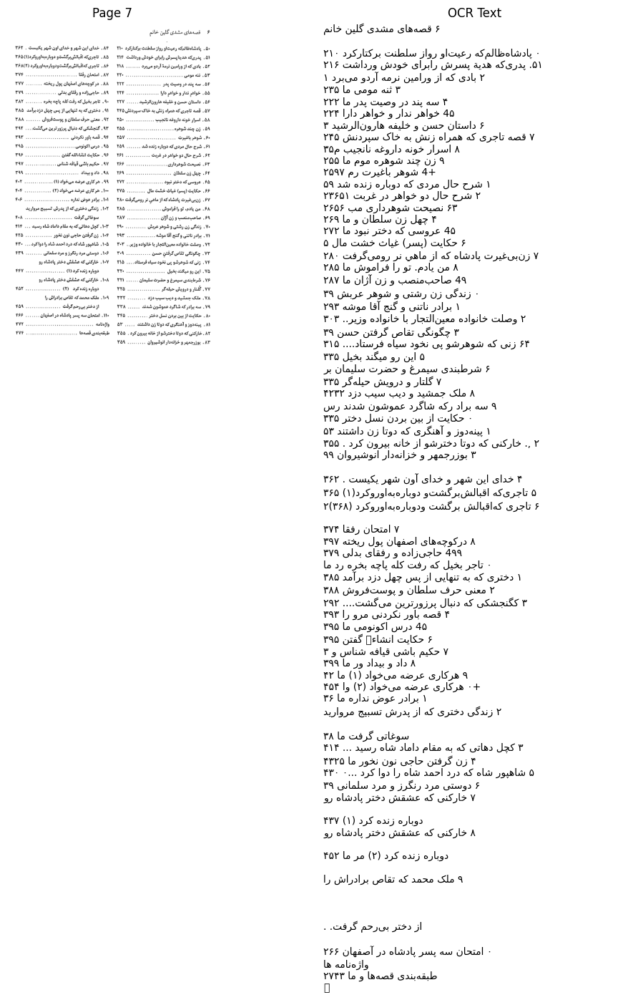

[2025-10-24 12:11:55] Page 7 OCR done.
[2025-10-24 12:11:55] Processing page 8...
[2025-10-24 12:11:55] Preprocessing page...
[2025-10-24 12:11:55] Preprocessing done.
[2025-10-24 12:11:55] Enhancing contrast...
[2025-10-24 12:11:55] Contrast enhancement done.
[2025-10-24 12:11:55] Rescaling image...
[2025-10-24 12:11:55] Rescaling done.
[2025-10-24 12:11:55] Running Tesseract OCR...
[2025-10-24 12:12:03] Tesseract OCR done.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


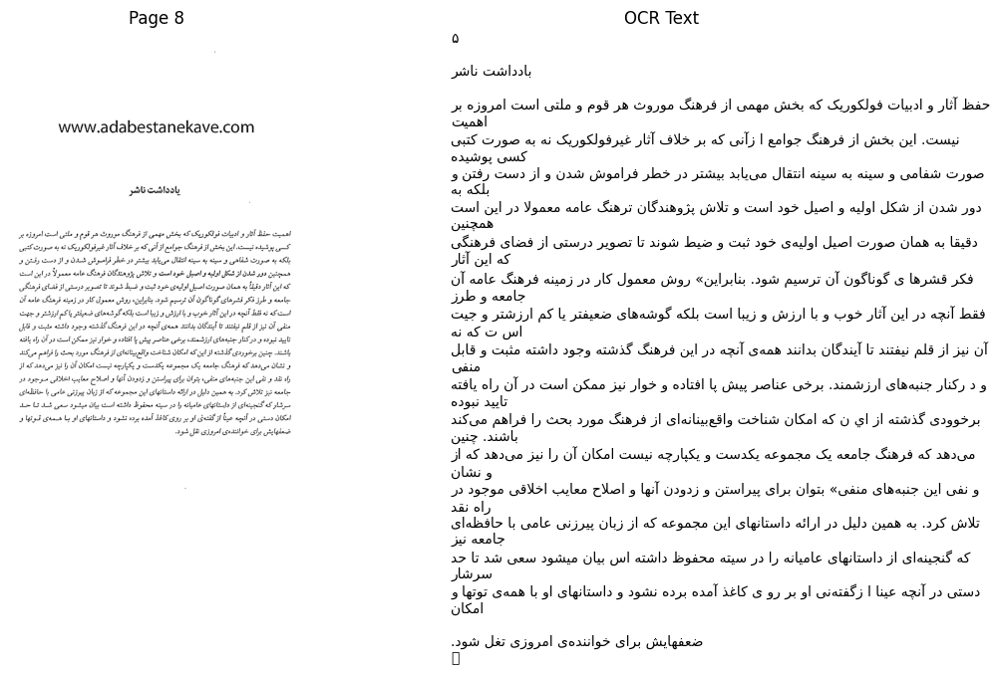

[2025-10-24 12:12:05] Page 8 OCR done.
[2025-10-24 12:12:05] Demo OCR completed.


{1: '۱۱قصعامیا:\n\n۸\nره\n۹\n/\nی\n\nنَدْایرا اي"\n\n؛ 5 گردآوردة ل.پ.الول\u200cساتن\nد /\n\n,ویرایش اولریش\u200cمار تسولف,\nآذرامیرحسینی نیتهامر,\n\n \n\x0c',
 2: '۸ دی گلیره خانم\n۰ قصةٌ عامیانه ایرانی\n\n09 ح 0عا سح [عا 8 م۵۵\n\nی\n\nنشرمرکز\n\x0c',
 3: '۵\n\n۳۹۸ الول -ساتن, لارنس پل\n1/۹۵۵ آناهم مها ,هانگ - ناونع\nق ۷۲۲الف قصه\u200cهای مشدی گلین خانم ۱۱۰ قصه عامیانه ایرانی/ گرد\u200cآورنده ل.پ. الول سائن؛ ویرایش\n\nآولریش مارتسولف» آذر امیرحسینی نیتهامر» احمد وکیلیان... تهران: نشر مرکزه ۱۳۷۴.\n۹ مس (نشرمرکز؛ شماره تشر ۲۳۵)\n.ع. به آنمانی: سانش اند د هط\n«مصقلا جاح الگد؟۸ ول مم\u200cوسالدت و۵\n\nچاپ دوم: ۱۳۷۶.\n۱ انسانه\u200cها و نصه\u200cهای ایرانی. الْف. عنوان. ب. عنوان: ۱۱۰ قصه عامپانه ایرانی.\n\n \n\n \n\x0c',
 4: 'قصه\u200cهای\nمشسدی گلین خانم\n\nگرد\u200cآوردة\n\nل. پ. لول ساتن\n\nویرایش\nاولریش مار تسولف. آذر امیرحسینی نیتهامر\n\nسید احمد وکیلیان\n\n۱0\n\nنشرمرکز\n\x0c',
 5: '0\n\nقصه\u200cهای مشدی\u200cگلین خانم\n۰ قصة عامیانه ایرانی\nگردآورده ل. پ. لول ساتن\nویرایش آولریش م

In [ ]:
processor_tesseract.process_demo(start_page=1, end_page=8, preprocess=True, contrast=True, scale=True, show=True)

[2025-10-24 12:12:05] Starting demo processing...
[2025-10-24 12:12:07] Processing page 1...
[2025-10-24 12:12:07] Running Qwen OCR...
[2025-10-24 12:12:10] Generating output from model, attempt 1...
[2025-10-24 12:12:12] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:12:12] Reducing image size from (2134,3364) to (1707,2691) and retrying...
[2025-10-24 12:12:14] Generating output from model, attempt 2...
[2025-10-24 12:12:15] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:12:15] Reducing image size from (1707,2691) to (1365,2152) and retrying...
[2025-10-24 12:12:17] Generating output from model, attempt 3...
[2025-10-24 12:12:17] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:12:17] Reducing image size from (1365,2152) to (1092,1721) and retrying...
[2025-10-24 12:12:18] Generating output from model, attempt 4...
[2025-10-24 12:12:19] CUDA OOM detected, clearing cache and reducing image size...
[20

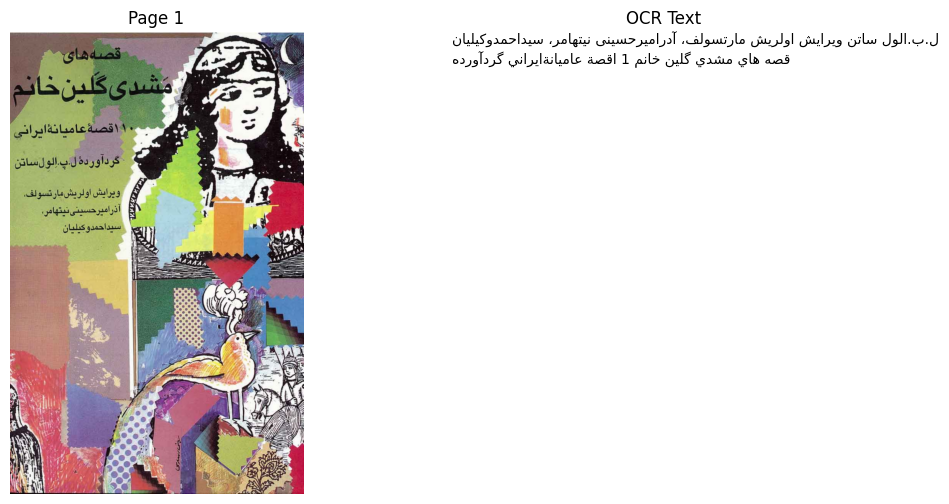

[2025-10-24 12:12:41] Page 1 OCR done.
[2025-10-24 12:12:41] Processing page 2...
[2025-10-24 12:12:41] Running Qwen OCR...
[2025-10-24 12:12:42] Generating output from model, attempt 1...
[2025-10-24 12:12:44] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:12:44] Reducing image size from (2134,3364) to (1707,2691) and retrying...
[2025-10-24 12:12:45] Generating output from model, attempt 2...
[2025-10-24 12:12:46] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:12:46] Reducing image size from (1707,2691) to (1365,2152) and retrying...
[2025-10-24 12:12:46] Generating output from model, attempt 3...
[2025-10-24 12:12:47] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:12:47] Reducing image size from (1365,2152) to (1092,1721) and retrying...
[2025-10-24 12:12:47] Generating output from model, attempt 4...
[2025-10-24 12:12:48] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12

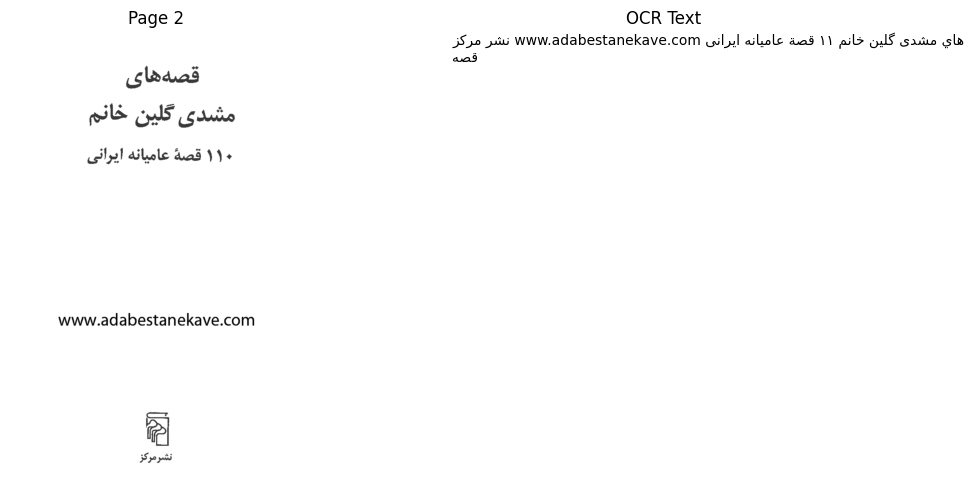

[2025-10-24 12:13:05] Page 2 OCR done.
[2025-10-24 12:13:05] Processing page 3...
[2025-10-24 12:13:05] Running Qwen OCR...
[2025-10-24 12:13:06] Generating output from model, attempt 1...
[2025-10-24 12:13:08] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:13:08] Reducing image size from (2134,3364) to (1707,2691) and retrying...
[2025-10-24 12:13:09] Generating output from model, attempt 2...
[2025-10-24 12:13:10] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:13:10] Reducing image size from (1707,2691) to (1365,2152) and retrying...
[2025-10-24 12:13:11] Generating output from model, attempt 3...
[2025-10-24 12:13:11] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:13:11] Reducing image size from (1365,2152) to (1092,1721) and retrying...
[2025-10-24 12:13:12] Generating output from model, attempt 4...
[2025-10-24 12:13:12] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12

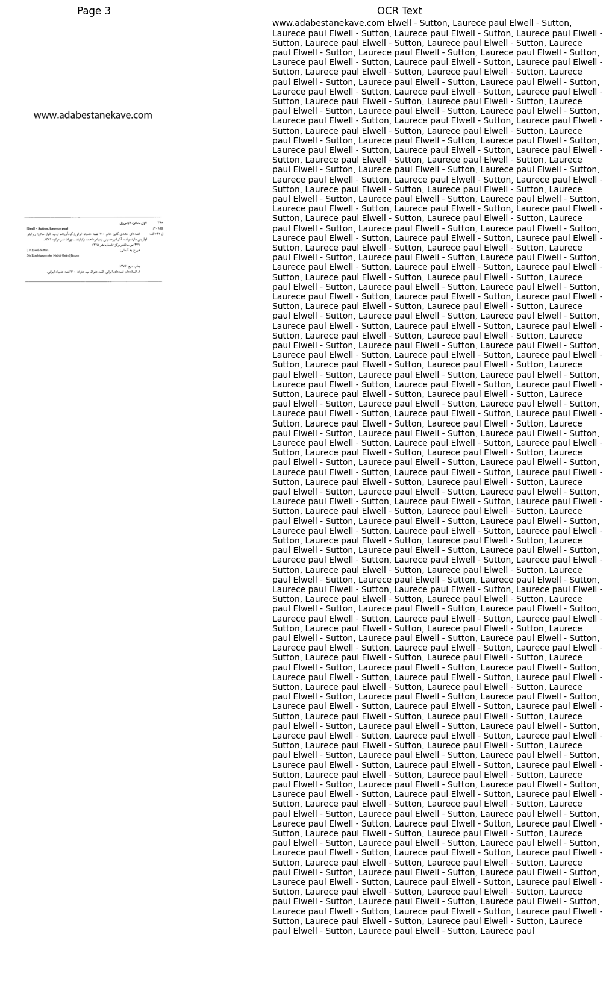

[2025-10-24 12:17:48] Page 3 OCR done.
[2025-10-24 12:17:48] Processing page 4...
[2025-10-24 12:17:48] Running Qwen OCR...
[2025-10-24 12:17:50] Generating output from model, attempt 1...
[2025-10-24 12:17:51] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:17:51] Reducing image size from (2134,3364) to (1707,2691) and retrying...
[2025-10-24 12:17:53] Generating output from model, attempt 2...
[2025-10-24 12:17:54] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:17:54] Reducing image size from (1707,2691) to (1365,2152) and retrying...
[2025-10-24 12:17:55] Generating output from model, attempt 3...
[2025-10-24 12:17:55] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:17:55] Reducing image size from (1365,2152) to (1092,1721) and retrying...
[2025-10-24 12:17:56] Generating output from model, attempt 4...
[2025-10-24 12:17:56] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12

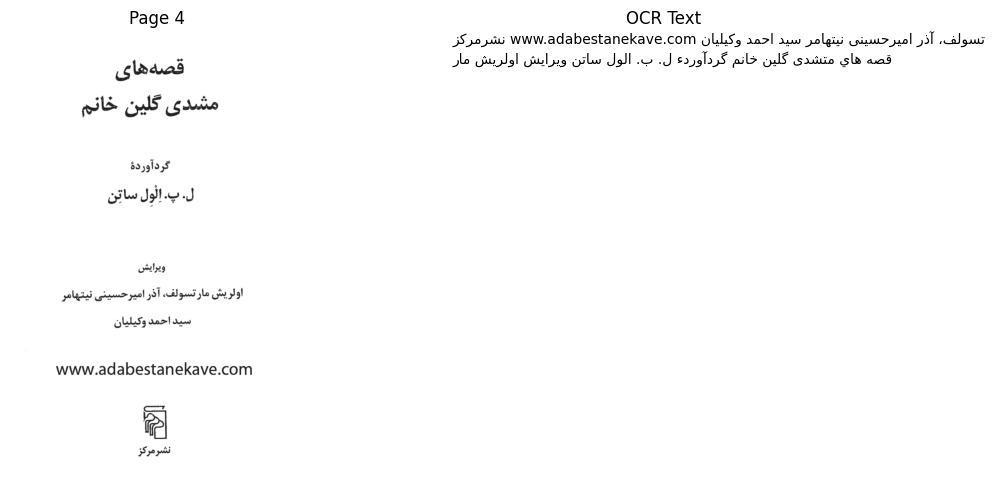

[2025-10-24 12:18:17] Page 4 OCR done.
[2025-10-24 12:18:17] Processing page 5...
[2025-10-24 12:18:17] Running Qwen OCR...
[2025-10-24 12:18:19] Generating output from model, attempt 1...
[2025-10-24 12:18:20] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:18:20] Reducing image size from (2134,3364) to (1707,2691) and retrying...
[2025-10-24 12:18:22] Generating output from model, attempt 2...
[2025-10-24 12:18:23] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:18:23] Reducing image size from (1707,2691) to (1365,2152) and retrying...
[2025-10-24 12:18:23] Generating output from model, attempt 3...
[2025-10-24 12:18:24] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:18:24] Reducing image size from (1365,2152) to (1092,1721) and retrying...
[2025-10-24 12:18:24] Generating output from model, attempt 4...
[2025-10-24 12:18:25] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12

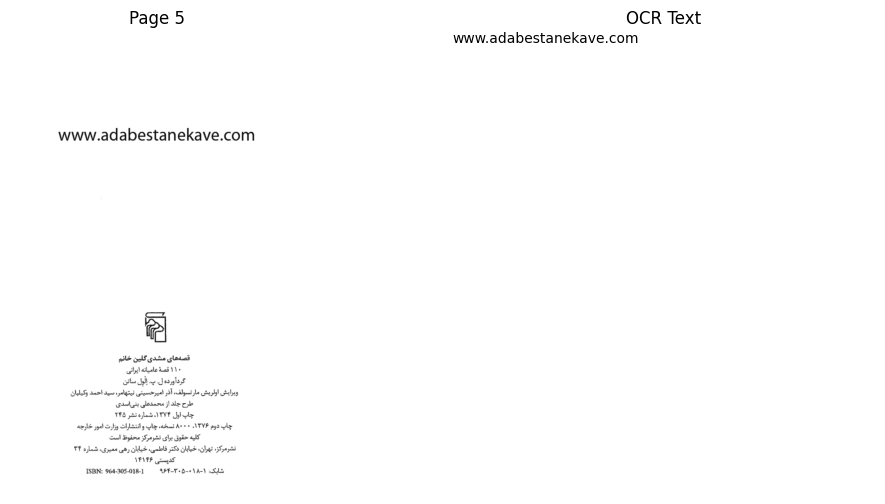

[2025-10-24 12:18:37] Page 5 OCR done.
[2025-10-24 12:18:37] Processing page 6...
[2025-10-24 12:18:37] Running Qwen OCR...
[2025-10-24 12:18:39] Generating output from model, attempt 1...
[2025-10-24 12:18:40] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:18:40] Reducing image size from (2134,3364) to (1707,2691) and retrying...
[2025-10-24 12:18:41] Generating output from model, attempt 2...
[2025-10-24 12:18:42] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:18:42] Reducing image size from (1707,2691) to (1365,2152) and retrying...
[2025-10-24 12:18:43] Generating output from model, attempt 3...
[2025-10-24 12:18:44] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12:18:44] Reducing image size from (1365,2152) to (1092,1721) and retrying...
[2025-10-24 12:18:44] Generating output from model, attempt 4...
[2025-10-24 12:18:45] CUDA OOM detected, clearing cache and reducing image size...
[2025-10-24 12

KeyboardInterrupt: 

In [ ]:
processor_qwen.process_demo(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False, show=True)

[2025-10-24 12:29:15] Starting demo processing...
[2025-10-24 12:29:21] Processing page 1...
[2025-10-24 12:29:21] Running Varco OCR...
[2025-10-24 12:29:21] Applying Varco chat template, attempt 1...


Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.


[2025-10-24 12:29:22] Generating output from Varco model, attempt 1...
[2025-10-24 12:31:02] Varco OCR done.


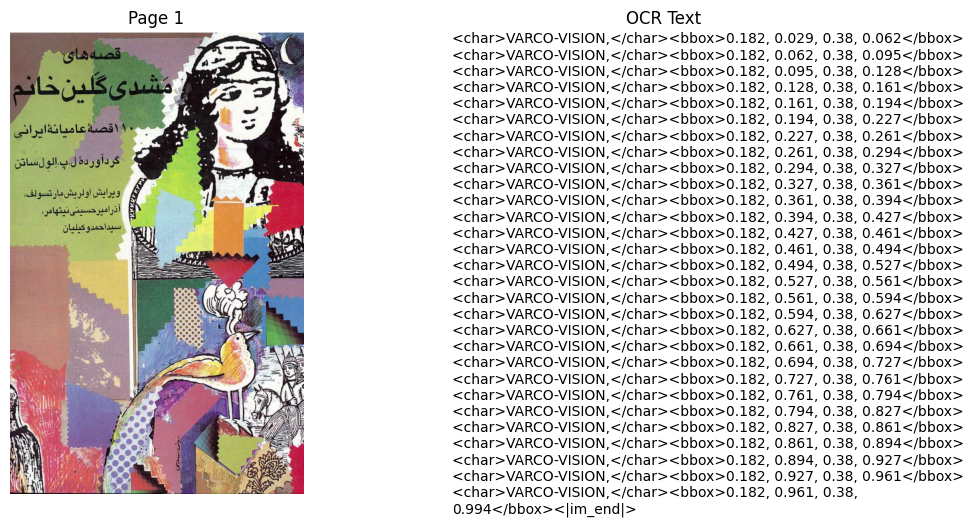

[2025-10-24 12:31:03] Page 1 OCR done.
[2025-10-24 12:31:03] Processing page 2...
[2025-10-24 12:31:03] Running Varco OCR...
[2025-10-24 12:31:03] Applying Varco chat template, attempt 1...


Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.


[2025-10-24 12:31:04] Generating output from Varco model, attempt 1...
[2025-10-24 12:31:14] Varco OCR done.


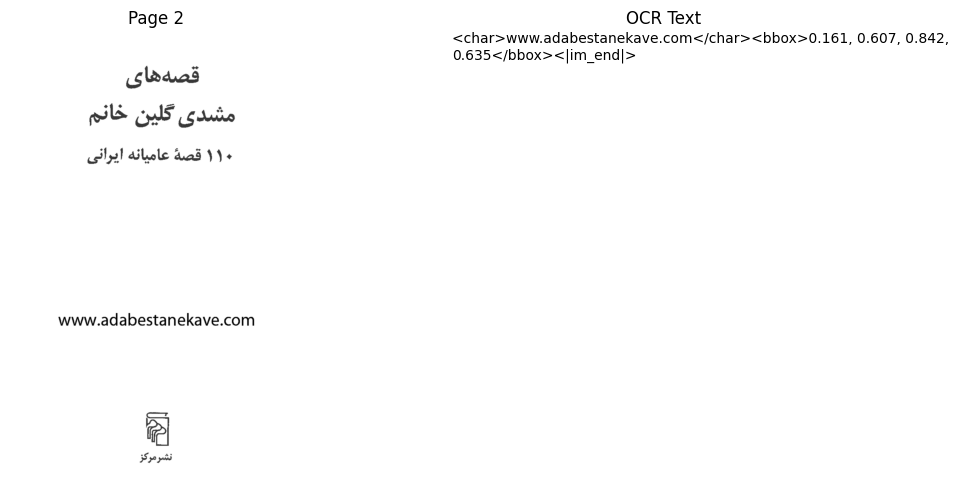

[2025-10-24 12:31:15] Page 2 OCR done.
[2025-10-24 12:31:15] Processing page 3...
[2025-10-24 12:31:15] Running Varco OCR...
[2025-10-24 12:31:15] Applying Varco chat template, attempt 1...


Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.


[2025-10-24 12:31:15] Generating output from Varco model, attempt 1...
[2025-10-24 12:32:32] Varco OCR done.


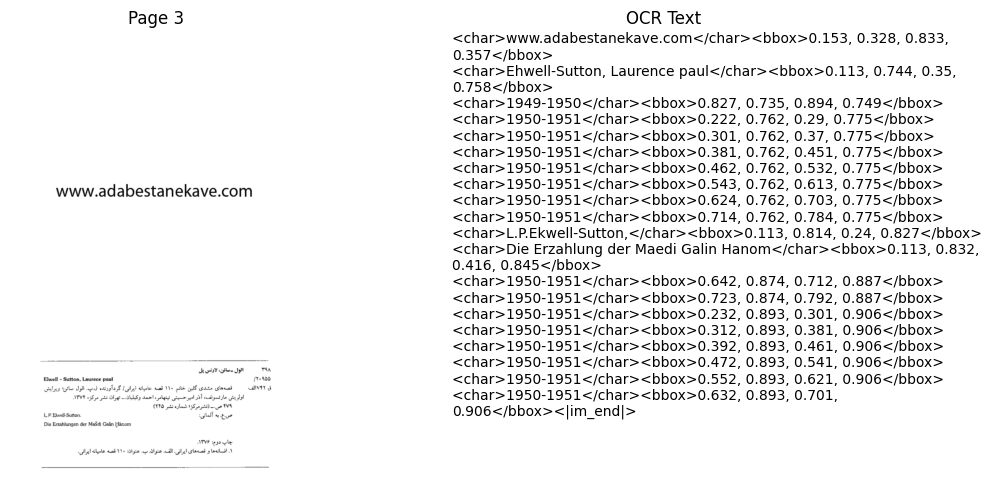

[2025-10-24 12:32:33] Page 3 OCR done.
[2025-10-24 12:32:33] Processing page 4...
[2025-10-24 12:32:33] Running Varco OCR...
[2025-10-24 12:32:33] Applying Varco chat template, attempt 1...


Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.


[2025-10-24 12:32:34] Generating output from Varco model, attempt 1...
[2025-10-24 12:32:44] Varco OCR done.


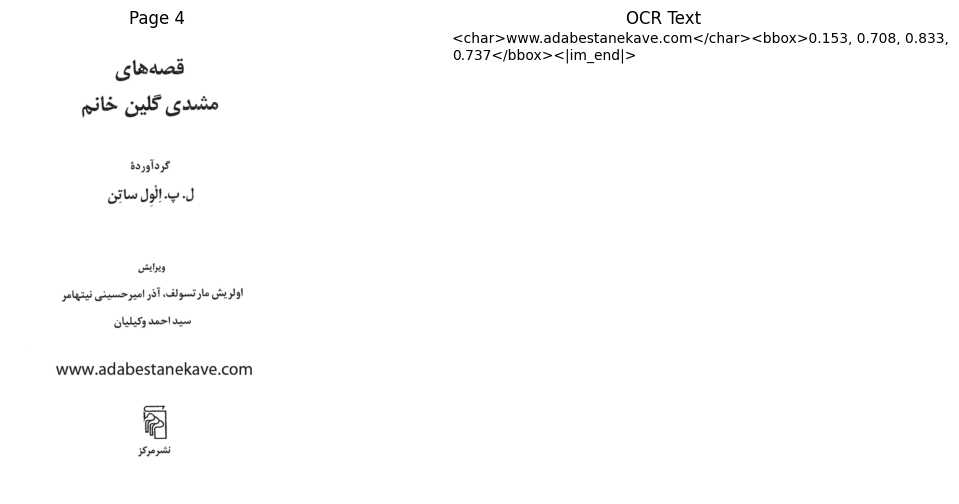

[2025-10-24 12:32:44] Page 4 OCR done.
[2025-10-24 12:32:44] Processing page 5...
[2025-10-24 12:32:44] Running Varco OCR...
[2025-10-24 12:32:44] Applying Varco chat template, attempt 1...


Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.


[2025-10-24 12:32:45] Generating output from Varco model, attempt 1...
[2025-10-24 12:34:24] Varco OCR done.


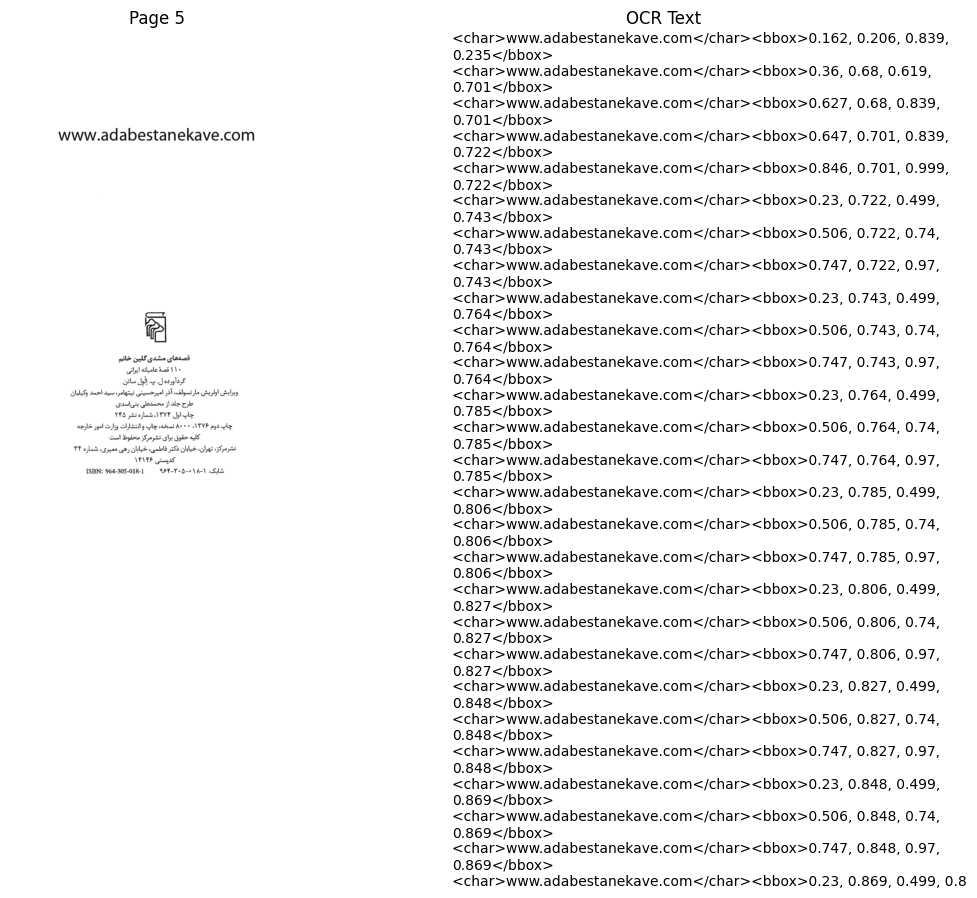

[2025-10-24 12:34:25] Page 5 OCR done.
[2025-10-24 12:34:25] Processing page 6...
[2025-10-24 12:34:25] Running Varco OCR...
[2025-10-24 12:34:25] Applying Varco chat template, attempt 1...


Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.


[2025-10-24 12:34:26] Generating output from Varco model, attempt 1...


KeyboardInterrupt: 

In [ ]:
processor_varco.process_demo(start_page=1, end_page=8, preprocess=False, contrast=False, scale=False, show=True)

In [ ]:
torch.cuda.empty_cache()
